In [10]:
# import required libraries
import os
import sys
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import warnings
import geopy
import itertools
import joblib
warnings.filterwarnings("ignore")

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from category_encoders import BinaryEncoder

from skfeature.function.similarity_based import fisher_score
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import KFold,train_test_split,GridSearchCV
from sklearn.feature_selection import SelectKBest, chi2, RFE, mutual_info_classif,f_classif
from sklearn.linear_model import LogisticRegression,LinearRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier,AdaBoostClassifier,HistGradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import KBinsDiscretizer, StandardScaler
from sklearn.decomposition import PCA
from sklearn.utils import shuffle
from sklearn.impute import KNNImputer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import BaggingClassifier

In [13]:
df = pd.read_csv("D:\Fault Transactions\data\Train.csv",na_values= "na")
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


For encoding categorical columns:
For category column use frequency.
For rest of the columns like job, state, city, country use threshold encoding: like for job replace a particular job category by a number which depends on the fraud cases found. In the test dataset replace new jib categoiries by a same number whcich is niether too low nor too high to make its importance medium when predicting . Insuch a way we will get less amt of false predictions than if we replace by them by a very low or a very high number

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

In [7]:
df.describe()

,Unnamed: 0,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
count,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06
mean,6.483370e+05,4.171920e+17,7.035104e+01,4.880067e+04,3.853762e+01,-9.022634e+01,8.882444e+04,1.349244e+09,3.853734e+01,-9.022646e+01,5.788652e-03
std,3.743180e+05,1.308806e+18,1.603160e+02,2.689322e+04,5.075808e+00,1.375908e+01,3.019564e+05,1.284128e+07,5.109788e+00,1.377109e+01,7.586269e-02
min,0.000000e+00,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902779e+01,-1.666712e+02,0.000000e+00
25%,3.241685e+05,1.800429e+14,9.650000e+00,2.623700e+04,3.462050e+01,-9.679800e+01,7.430000e+02,1.338751e+09,3.473357e+01,-9.689728e+01,0.000000e+00
50%,6.483370e+05,3.521417e+15,4.752000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.456000e+03,1.349250e+09,3.936568e+01,-8.743839e+01,0.000000e+00
75%,9.725055e+05,4.642255e+15,8.314000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.359385e+09,4.195716e+01,-8.023680e+01,0.000000e+00
max,1.296674e+06,4.992346e+18,2.894890e+04,9.978300e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.371817e+09,6.751027e+01,-6.695090e+01,1.000000e+00


Extract time of transaction hour,min,second columns to be made from trans_date_trans_time column


In [15]:
df['datetime'] = pd.to_datetime(df['trans_date_trans_time'])
df['time'] = df['datetime'].dt.time
df['hour'] = df['datetime'].dt.hour
df['minute'] = df['datetime'].dt.minute
df['second'] = df['datetime'].dt.second
df['date'] =  df['datetime'].dt.date

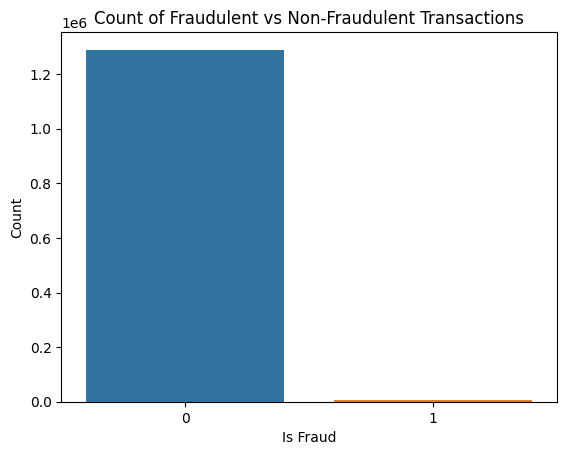

is_fraud
0    1289169
1       7506
Name: count, dtype: int64

In [16]:
sns.countplot(x='is_fraud', data=df)

# Set the labels and title
plt.xlabel('Is Fraud')
plt.ylabel('Count')
plt.title('Count of Fraudulent vs Non-Fraudulent Transactions')

# Show the plot
plt.show()
df['is_fraud'].value_counts()

In [17]:
df.columns

Index(['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category',
       'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip',
       'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time',
       'merch_lat', 'merch_long', 'is_fraud', 'datetime', 'time', 'hour',
       'minute', 'second', 'date'],
      dtype='object')

In [18]:
uselss_cols = ['Unnamed: 0','trans_date_trans_time','datetime','merchant','first','last','dob','trans_num']

The target variable is very imbalanced. Need to be balanced before modelling

In [19]:
numerical_cols = [cols for cols in df.columns if df[cols].dtype!='O' and cols not in uselss_cols and cols != 'is_fraud']
categorical_cols = [cols for cols in df.columns if df[cols].dtype =='O' and cols not in uselss_cols]
categorical_cols.append('is_fraud')    
print(f'There are {len(numerical_cols)} numerical columns: {numerical_cols}')
print(f'There are {len(categorical_cols)} categorical columns: {categorical_cols}')

There are 12 numerical columns: ['cc_num', 'amt', 'zip', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long', 'hour', 'minute', 'second']
There are 9 categorical columns: ['category', 'gender', 'street', 'city', 'state', 'job', 'time', 'date', 'is_fraud']


In [20]:
def generate_kdeplots(df, columns, n_cols=3):
    n_plots = len(columns)
    n_rows = (n_plots + n_cols - 1) // n_cols  # Calculate the number of rows needed

    plt.figure(figsize=(n_cols * 6, n_rows * 4))

    for i, column in enumerate(columns):
        plt.subplot(n_rows, n_cols, i + 1)
        sns.kdeplot(data =df,x=df[column], hue = 'is_fraud',palette='crest',alpha =0.3,fill=True)
        plt.title(f'KDE Plot for {column}')
        plt.xlabel(column)
        plt.ylabel('Density')

    plt.tight_layout()
    plt.show()

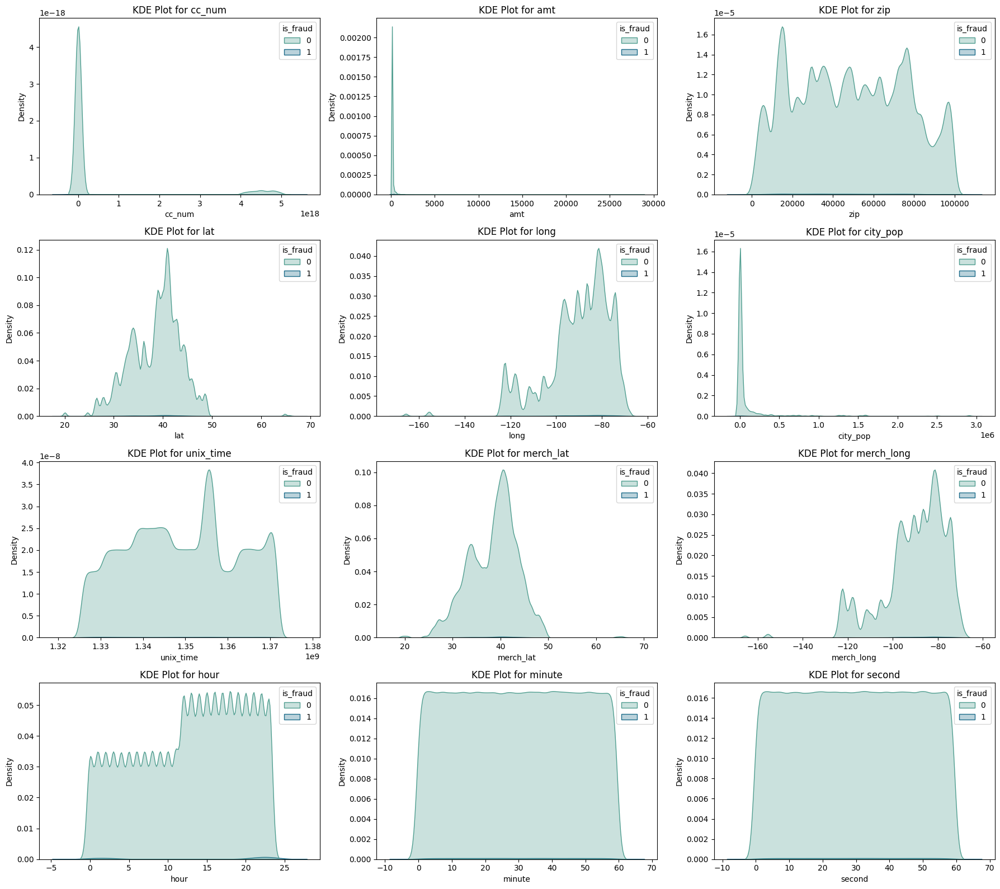

In [21]:
generate_kdeplots(df,numerical_cols)

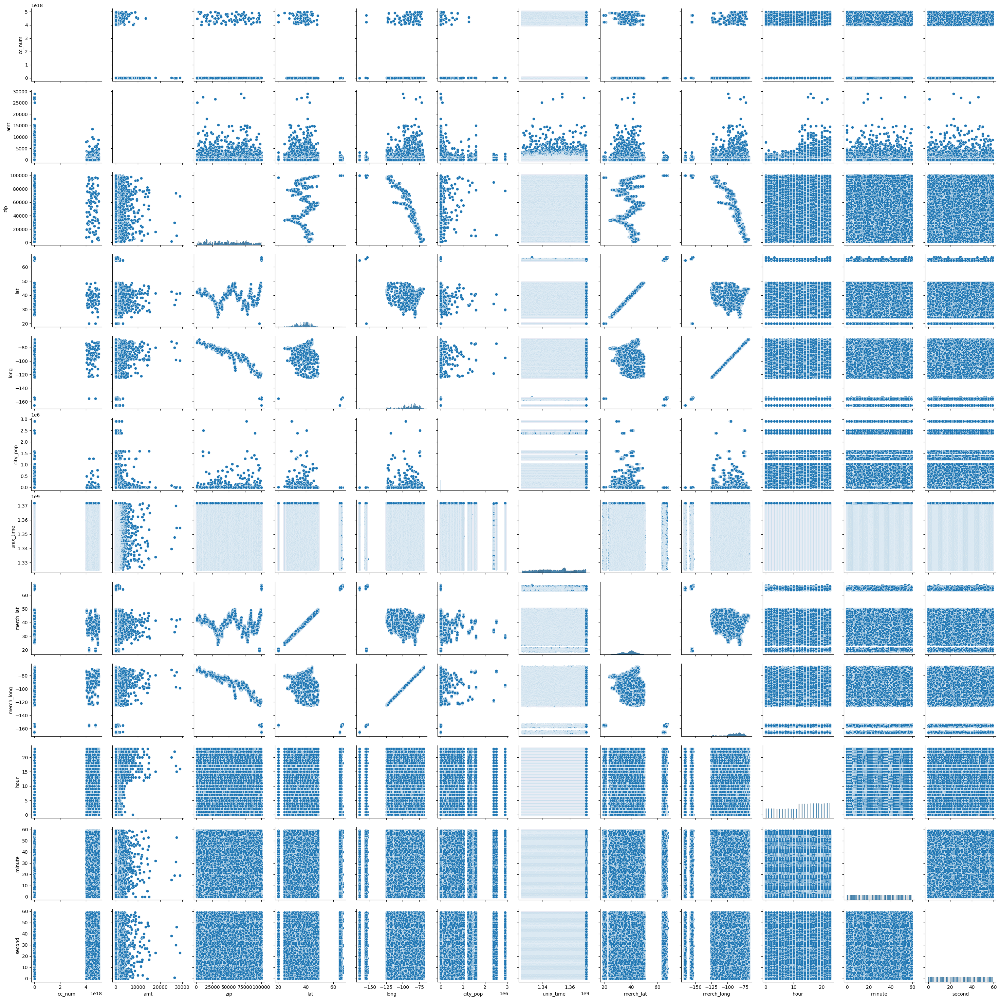

In [32]:
sns.pairplot(df[numerical_cols])

In [72]:
df.nunique()

Unnamed: 0               1296675
trans_date_trans_time    1274791
cc_num                       983
merchant                     693
category                      14
amt                        52928
first                        352
last                         481
gender                         2
street                       983
city                         894
state                         51
zip                          970
lat                          968
long                         969
city_pop                     879
job                          494
dob                          968
trans_num                1296675
unix_time                1274823
merch_lat                1247805
merch_long               1275745
is_fraud                       2
datetime                 1274791
time                       86400
hour                          24
minute                        60
second                        60
date                         537
dtype: int64

Creating some new features

In [21]:
# Calculate the average amount spent for each credit card number
avg_amt = df.groupby('cc_num')['amt'].mean().reset_index()
avg_amt.columns = ['cc_num', 'avg_amt_spent_cc_num']

# Merge the average amounts back to the original DataFrame
df = pd.merge(df, avg_amt, on='cc_num', how='left')
df['trans_amt_cc_num'] = df['amt']-df['avg_amt_spent_cc_num']  

In [22]:
# Calculate the average amount spent for each merchant
avg_amt = df.groupby('merchant')['amt'].mean().reset_index()
avg_amt.columns = ['merchant', 'avg_amt_spent_merchant']

# Merge the average amounts back to the original DataFrame
df = pd.merge(df, avg_amt, on='merchant', how='left')
df['trans_amt_merchant'] = df['amt']-df['avg_amt_spent_merchant']

In [23]:
# Calulating the avg time transactions happen for each merchant
avg_hours =  df.groupby('merchant')['hour'].mean().reset_index()
avg_hours.columns = ['merchant', 'avg_trans_hours_merchant']
df = pd.merge(df, avg_hours, on='merchant', how='left')
df['curr_trans_hour_merchant'] = df['hour']-df['avg_trans_hours_merchant']

In [24]:
# Calulating the avg time transactions happen for each cc_num
avg_hours =  df.groupby('cc_num')['hour'].mean().reset_index()
avg_hours.columns = ['cc_num', 'avg_trans_hours_cc_num']
df = pd.merge(df, avg_hours, on='cc_num', how='left')
df['curr_trans_hour_cc_num'] = df['hour']-df['avg_trans_hours_cc_num']

In [25]:
# Group by 'merchant' and 'date', then count the transactions
merchant_transactions = df.groupby(['merchant', 'date']).size().reset_index(name='num_transactions_per_day')

# Merge the transaction counts back to the original DataFrame
df = pd.merge(df, merchant_transactions, on=['merchant', 'date'], how='left')


In [26]:
df['ratio_curr_amt_avg_cc_num'] = df['amt']/df['avg_amt_spent_cc_num']
df['ratio_curr_amt_avg_merchant'] = df['amt']/df['avg_amt_spent_merchant']

In [27]:
# Calculate distance between mechant location and original location using the the latitudes and longitudes
from geopy.distance import geodesic
def calculate_distance(row):
    original_position = (row['lat'], row['long'])
    merch_position = (row['merch_lat'], row['merch_long'])
    return geodesic(original_position, merch_position).kilometers

df['distance_km'] = df.apply(calculate_distance, axis=1)

In [28]:
# Calculate the total amount transaction for each credit card number
total_amt = df.groupby('cc_num')['amt'].sum().reset_index()
total_amt.columns = ['cc_num', 'total_amt_spent_cc_num']

# Merge the average amounts back to the original DataFrame
df = pd.merge(df, total_amt, on='cc_num', how='left')

In [29]:
# Calculate the total amount transaction for each merchant
total_amt = df.groupby('merchant')['amt'].sum().reset_index()
total_amt.columns = ['merchant', 'total_amt_spent_merchant']

# Merge the average amounts back to the original DataFrame
df = pd.merge(df, total_amt, on='merchant', how='left')

Generate scatter plots for numerical columns in the list with hue based on the 'is_fraud' colum

In [30]:
imp_cols = ['total_amt_spent_merchant','total_amt_spent_cc_num','distance_km','ratio_curr_amt_avg_merchant','ratio_curr_amt_avg_cc_num','num_transactions_per_day','curr_trans_hour_cc_num','curr_trans_hour_merchant','trans_amt_merchant','trans_amt_cc_num']

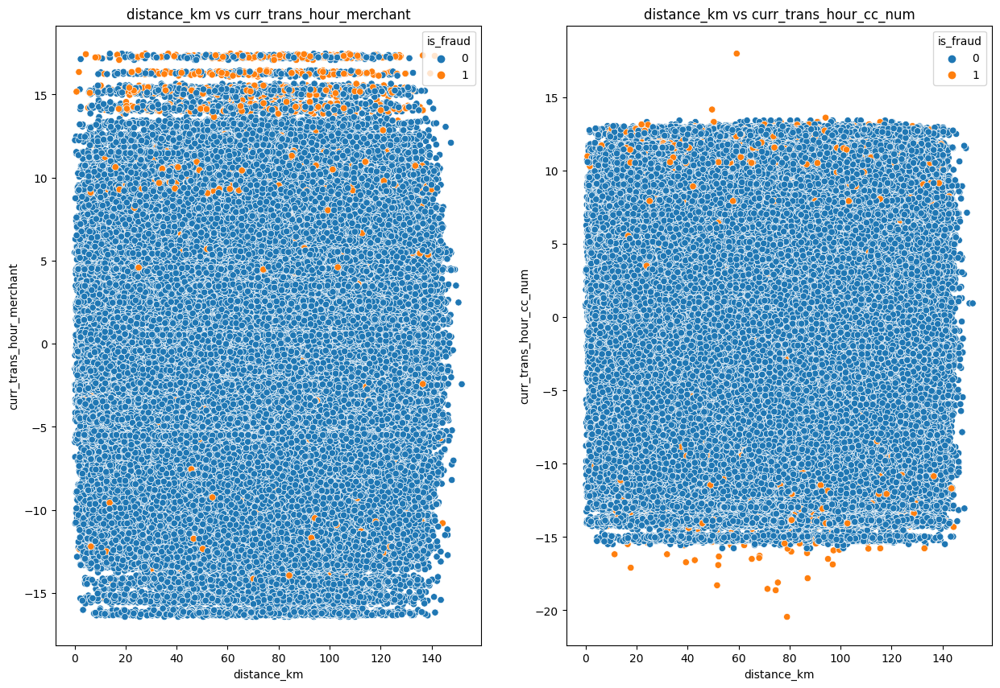

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes = axes.flatten()
sns.scatterplot(data=df, x="distance_km", y="curr_trans_hour_merchant", hue='is_fraud',ax=axes[0])
axes[0].set_title('distance_km vs curr_trans_hour_merchant')
axes[0].legend(title='is_fraud', loc='best')
sns.scatterplot(data=df, x="distance_km", y="curr_trans_hour_cc_num", hue='is_fraud',ax=axes[1])
axes[1].set_title('distance_km vs curr_trans_hour_cc_num')
axes[1].legend(title='is_fraud', loc='best')

for transactions for each merchant fraud transactions occur mostly time very much after usual time of transaction(15 hrs)
for trasaction through each credit card fraud transactions occur mostly very before the usual time of tarnsaction(15 hrs)

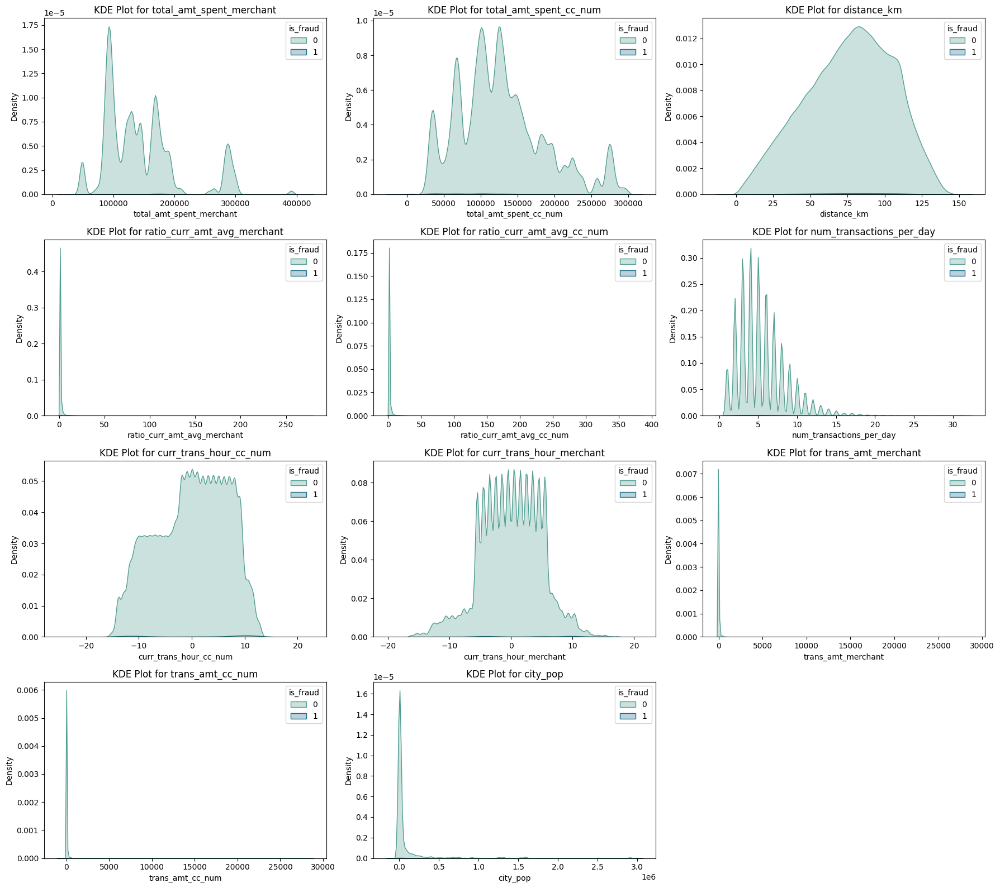

In [105]:
imp_cols = ['total_amt_spent_merchant','total_amt_spent_cc_num','distance_km','ratio_curr_amt_avg_merchant','ratio_curr_amt_avg_cc_num','num_transactions_per_day','curr_trans_hour_cc_num','curr_trans_hour_merchant','trans_amt_merchant','trans_amt_cc_num','city_pop'] 
generate_kdeplots(df,imp_cols)

total_amt_spent_merchant and total_amt_spent_cc_num, num_transactions_per_day are not normally distributed

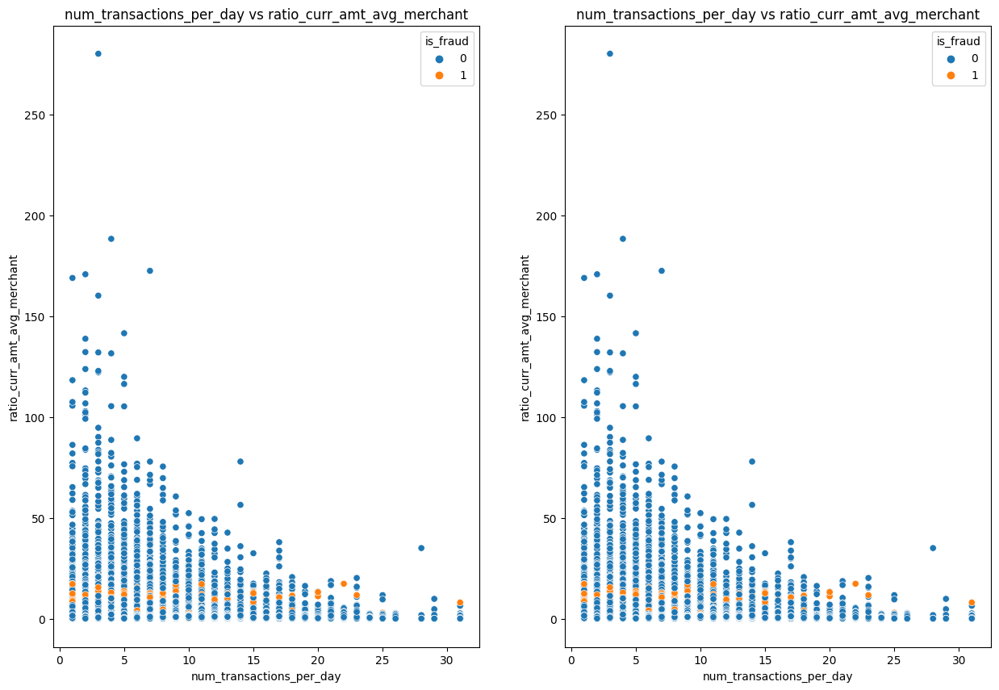

In [81]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes = axes.flatten()
sns.scatterplot(data=df, x="num_transactions_per_day", y="ratio_curr_amt_avg_merchant", hue='is_fraud',ax=axes[0])
axes[0].set_title('num_transactions_per_day vs ratio_curr_amt_avg_merchant')
axes[0].legend(title='is_fraud', loc='best')
sns.scatterplot(data=df, x="num_transactions_per_day", y="ratio_curr_amt_avg_merchant", hue='is_fraud',ax=axes[1])
axes[1].set_title('num_transactions_per_day vs ratio_curr_amt_avg_merchant')
axes[1].legend(title='is_fraud', loc='best')

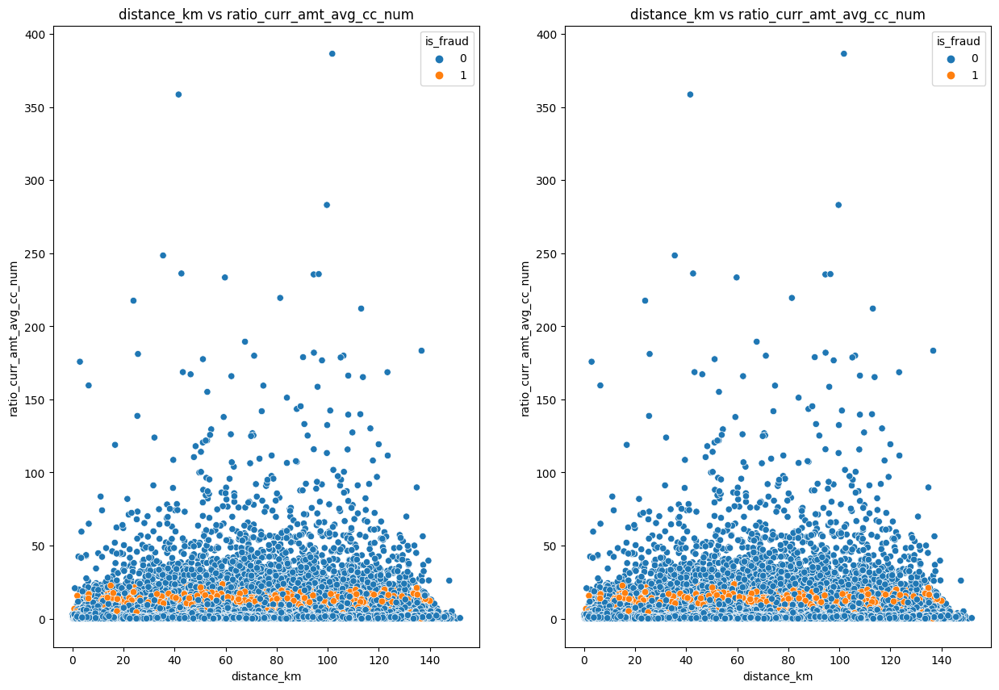

In [82]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes = axes.flatten()
sns.scatterplot(data=df, x="distance_km", y="ratio_curr_amt_avg_cc_num", hue='is_fraud',ax=axes[0])
axes[0].set_title('distance_km vs ratio_curr_amt_avg_cc_num')
axes[0].legend(title='is_fraud', loc='best')
sns.scatterplot(data=df, x="distance_km", y="ratio_curr_amt_avg_cc_num", hue='is_fraud',ax=axes[1])
axes[1].set_title('distance_km vs ratio_curr_amt_avg_cc_num')
axes[1].legend(title='is_fraud', loc='best')

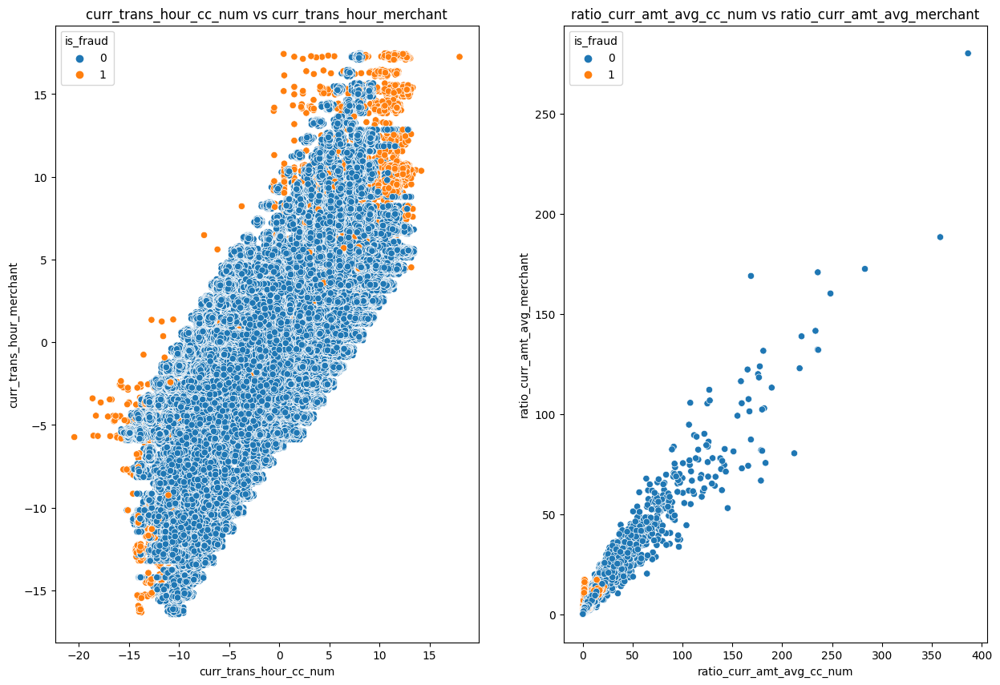

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes = axes.flatten()
sns.scatterplot(data=df, x="curr_trans_hour_cc_num", y="curr_trans_hour_merchant", hue='is_fraud',ax=axes[0])
axes[0].set_title('curr_trans_hour_cc_num vs curr_trans_hour_merchant')
axes[0].legend(title='is_fraud', loc='best')
sns.scatterplot(data=df, x="ratio_curr_amt_avg_cc_num", y="ratio_curr_amt_avg_merchant", hue='is_fraud',ax=axes[1])
axes[1].set_title('ratio_curr_amt_avg_cc_num vs ratio_curr_amt_avg_merchant')
axes[1].legend(title='is_fraud', loc='best')

<Axes: xlabel='num_transactions_per_day', ylabel='distance_km'>

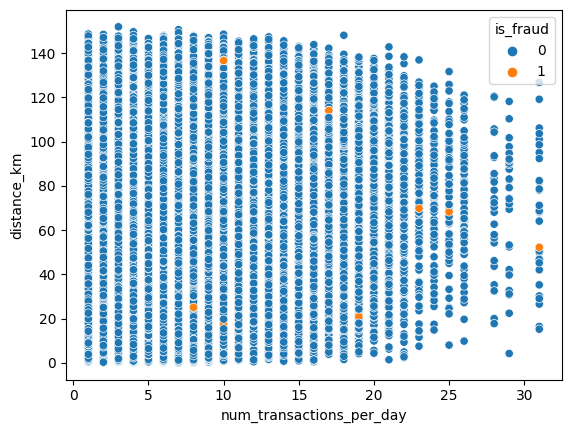

In [86]:
sns.scatterplot(data=df, x="num_transactions_per_day", y="distance_km", hue='is_fraud')

In [23]:
numerical_cols = [cols for cols in df.columns if df[cols].dtype!='O' and cols not in uselss_cols and cols != 'is_fraud']
categorical_cols = [cols for cols in df.columns if df[cols].dtype =='O' and cols not in uselss_cols]
categorical_cols.append('is_fraud')    
print(f'There are {len(numerical_cols)} numerical columns: {numerical_cols}')
print(f'There are {len(categorical_cols)} categorical columns: {categorical_cols}')

There are 26 numerical columns: ['cc_num', 'amt', 'zip', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long', 'hour', 'minute', 'second', 'avg_amt_spent_cc_num', 'trans_amt_cc_num', 'avg_amt_spent_merchant', 'trans_amt_merchant', 'avg_trans_hours_merchant', 'curr_trans_hour_merchant', 'avg_trans_hours_cc_num', 'curr_trans_hour_cc_num', 'num_transactions_per_day', 'ratio_curr_amt_avg_cc_num', 'ratio_curr_amt_avg_merchant', 'distance_km', 'total_amt_spent_cc_num', 'total_amt_spent_merchant']
There are 9 categorical columns: ['category', 'gender', 'street', 'city', 'state', 'job', 'time', 'date', 'is_fraud']


<Axes: >

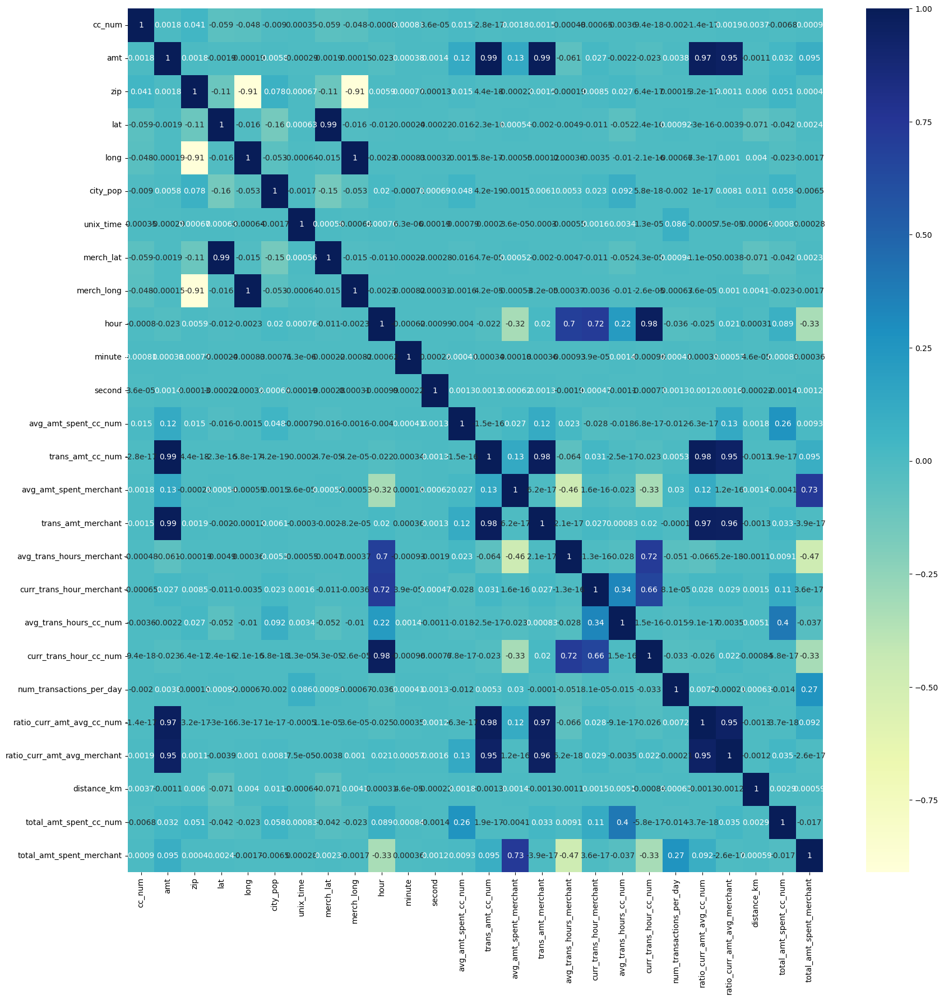

In [29]:
plt.figure(figsize=(20,20))
sns.heatmap(df[numerical_cols].corr(),annot=True,cmap ='YlGnBu')

In [31]:
numerical_cols = [cols for cols in df.columns if df[cols].dtype!='O' and cols not in uselss_cols and cols != 'is_fraud']
categorical_cols = [cols for cols in df.columns if df[cols].dtype =='O' and cols not in uselss_cols]
categorical_cols.append('is_fraud')   
categorical_cols.remove('time') 
print(f'There are {len(numerical_cols)} numerical columns: {numerical_cols}')
print(f'There are {len(categorical_cols)} categorical columns: {categorical_cols}')

There are 26 numerical columns: ['cc_num', 'amt', 'zip', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long', 'hour', 'minute', 'second', 'avg_amt_spent_cc_num', 'trans_amt_cc_num', 'avg_amt_spent_merchant', 'trans_amt_merchant', 'avg_trans_hours_merchant', 'curr_trans_hour_merchant', 'avg_trans_hours_cc_num', 'curr_trans_hour_cc_num', 'num_transactions_per_day', 'ratio_curr_amt_avg_cc_num', 'ratio_curr_amt_avg_merchant', 'distance_km', 'total_amt_spent_cc_num', 'total_amt_spent_merchant']
There are 8 categorical columns: ['category', 'gender', 'street', 'city', 'state', 'job', 'date', 'is_fraud']


For the columns street, city, state, job, category.. will encode such that a particular(unique) name is replaced by its frequency of occurance in case the record is found to be fraud. In other cases if the case is not fraud will replace by 0

In [25]:
def barplots_by_category(df, categorical_col, target_col='is_fraud'):
    # Filter the DataFrame to include only fraud cases
    fraud_cases = df[df[target_col] == 1]
    
    # Count the number of fraud cases for each category
    fraud_counts = fraud_cases[categorical_col].value_counts()
    
    # Plot the bar chart
    plt.figure(figsize=(12, 6))
    fraud_counts.plot(kind='bar', color='skyblue')
    plt.title(f'Number of Fraud Cases by {categorical_col}')
    plt.xlabel(categorical_col)
    plt.ylabel('Number of Fraud Cases')
    plt.xticks(rotation=45, ha='right')
    plt.show()

def barplots_by_category_without_x(df, categorical_col, target_col='is_fraud'):
# Filter the DataFrame to include only fraud cases
    fraud_cases = df[df[target_col] == 1]
    
    # Count the number of fraud cases for each category
    fraud_counts = fraud_cases[categorical_col].value_counts()
    
    # Plot the bar chart
    plt.figure(figsize=(12, 6))
    fraud_counts.plot(kind='bar', color='skyblue')
    plt.title(f'Number of Fraud Cases by {categorical_col}')
    plt.xlabel(categorical_col)
    plt.ylabel('Number of Fraud Cases')
    plt.xticks([])
    plt.show()

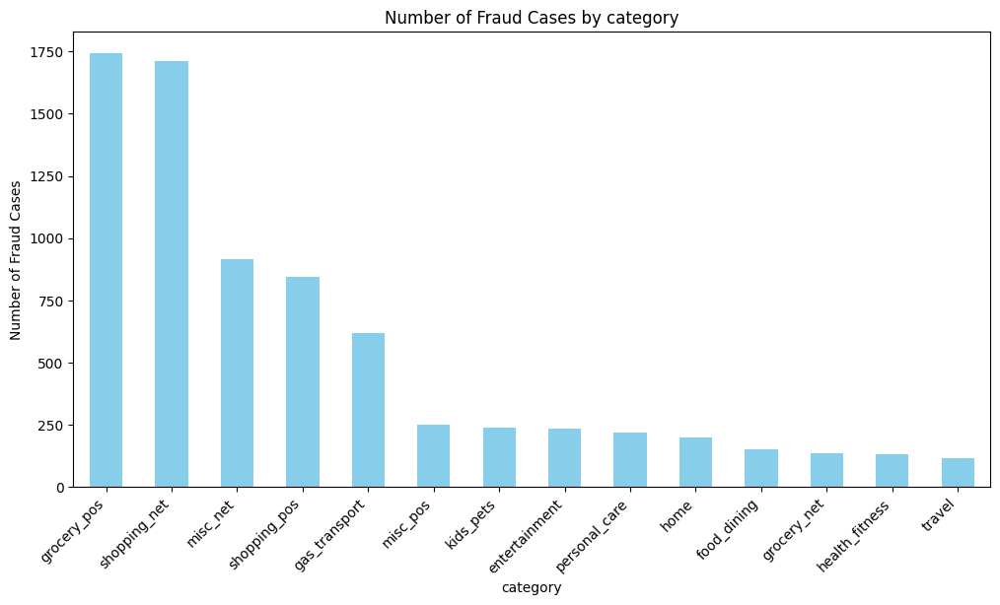

In [44]:
barplots_by_category(df,'category')

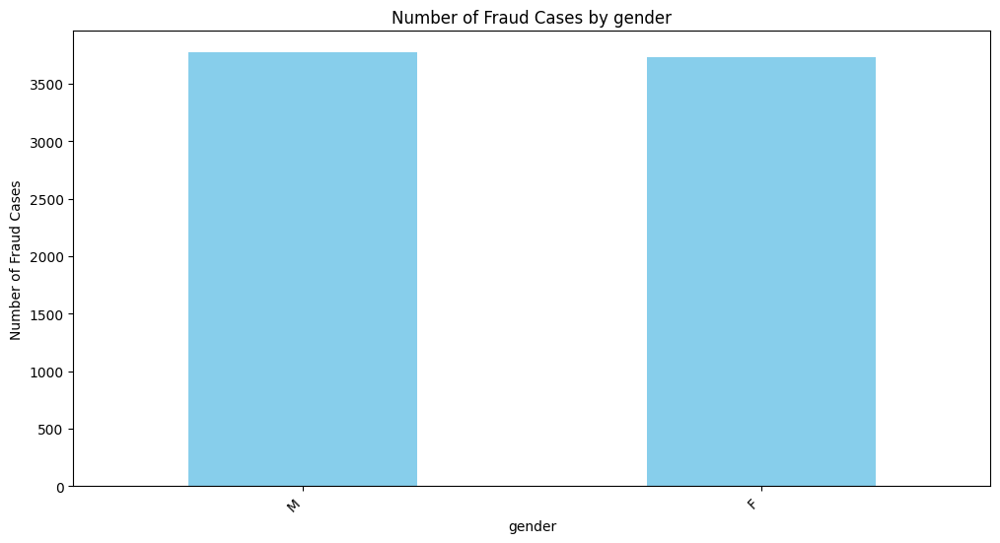

In [90]:
barplots_by_category(df,'gender')

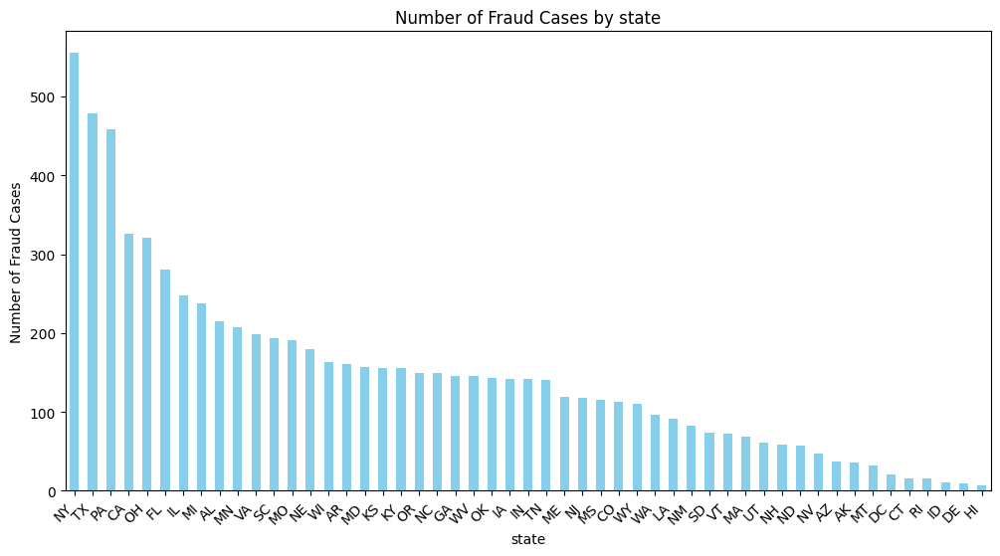

In [91]:
barplots_by_category(df,'state')

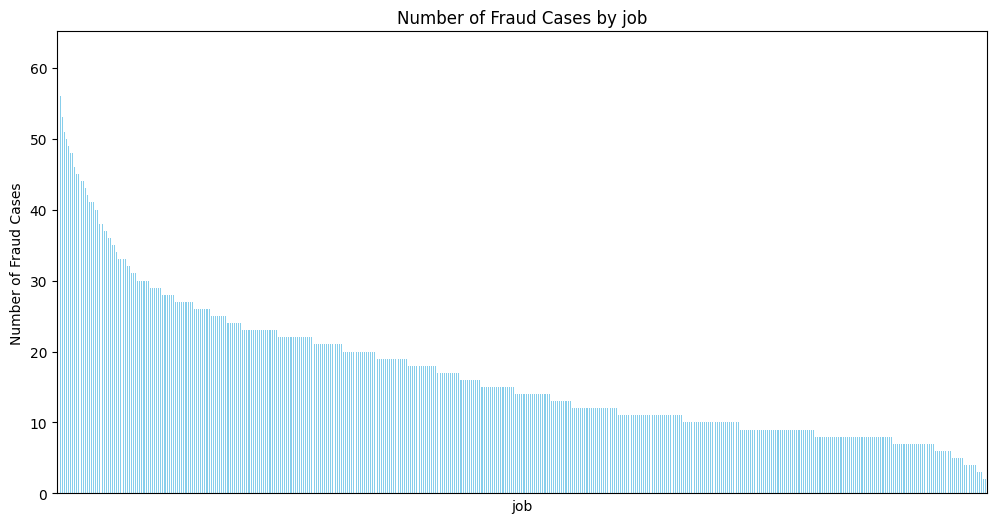

In [96]:
barplots_by_category_without_x(df,'job')

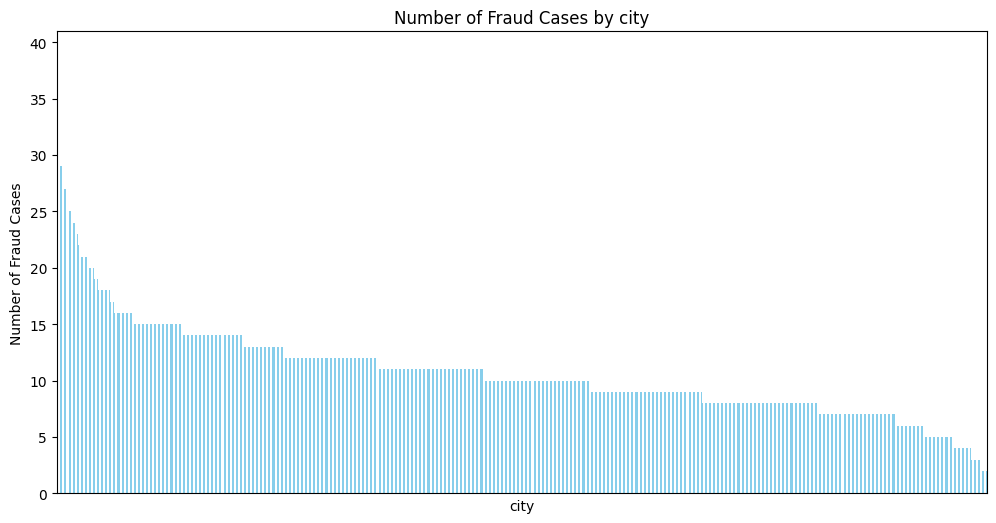

In [97]:
barplots_by_category_without_x(df,'city')

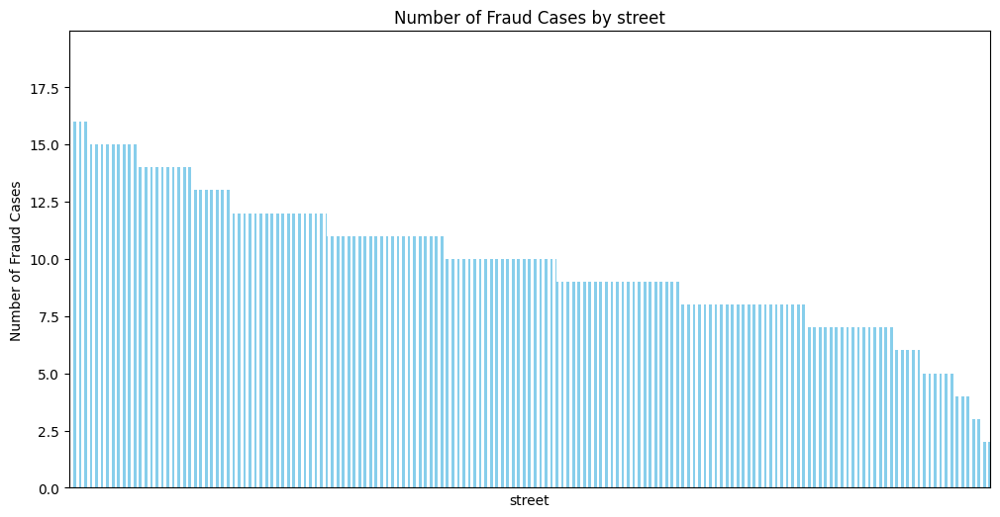

In [98]:
barplots_by_category_without_x(df,'street')

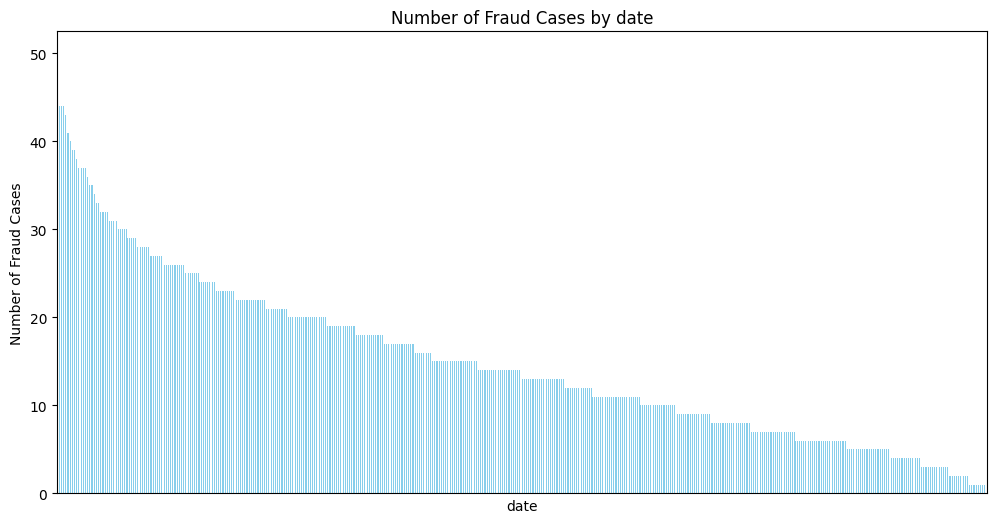

In [103]:
barplots_by_category_without_x(df,'date')

Looking at the distribution of categories in categorical columns

In [4]:
def plot_category_distribution(df, column_name):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=column_name, palette="viridis")
    plt.title(f'Distribution of Categories in {column_name}')
    plt.xlabel(column_name)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()
    
def plot_category_distribution_without_x(df, column_name):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=column_name, palette="viridis")
    plt.title(f'Distribution of Categories in {column_name}')
    plt.xlabel(column_name)
    
    plt.ylabel('Count')
    plt.xticks([])
    plt.show()


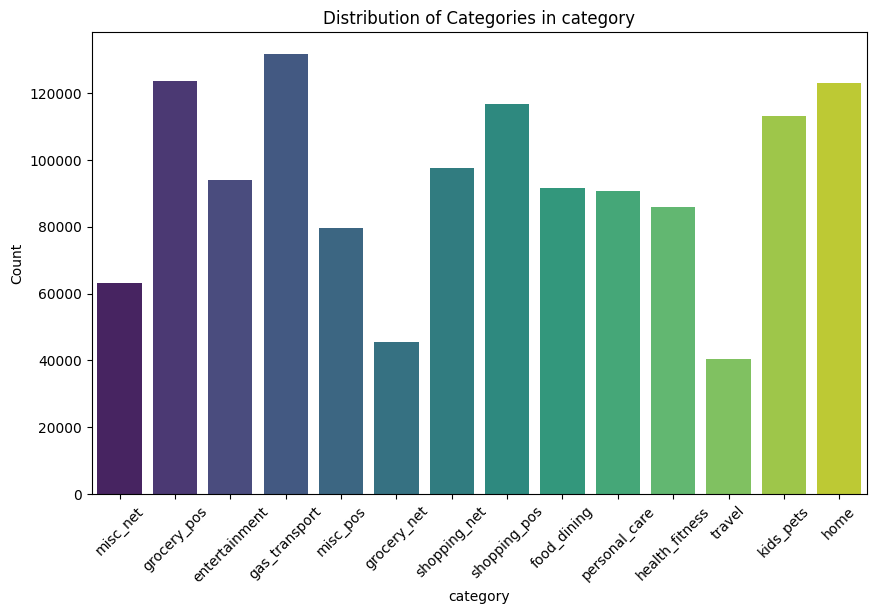

In [38]:
plot_category_distribution(df,'category')

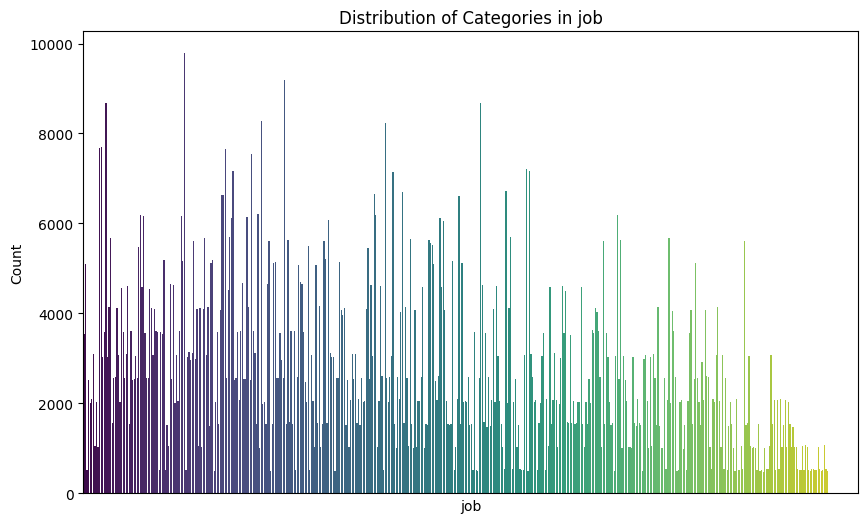

In [43]:
plot_category_distribution_without_x(df,'job')

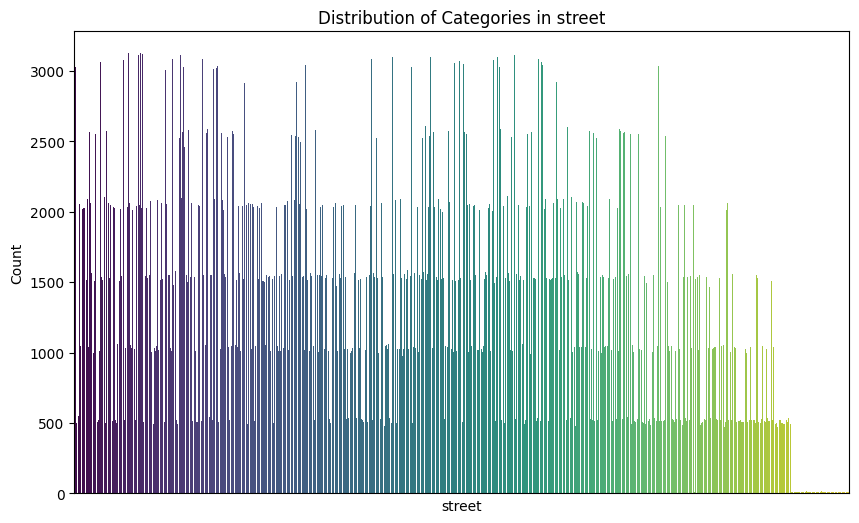

In [44]:
plot_category_distribution_without_x(df,'street')

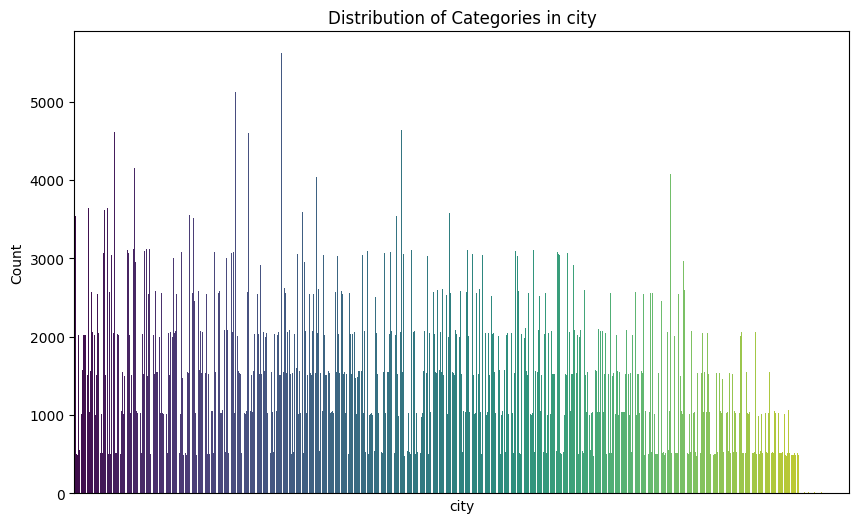

In [45]:
plot_category_distribution_without_x(df,'city')

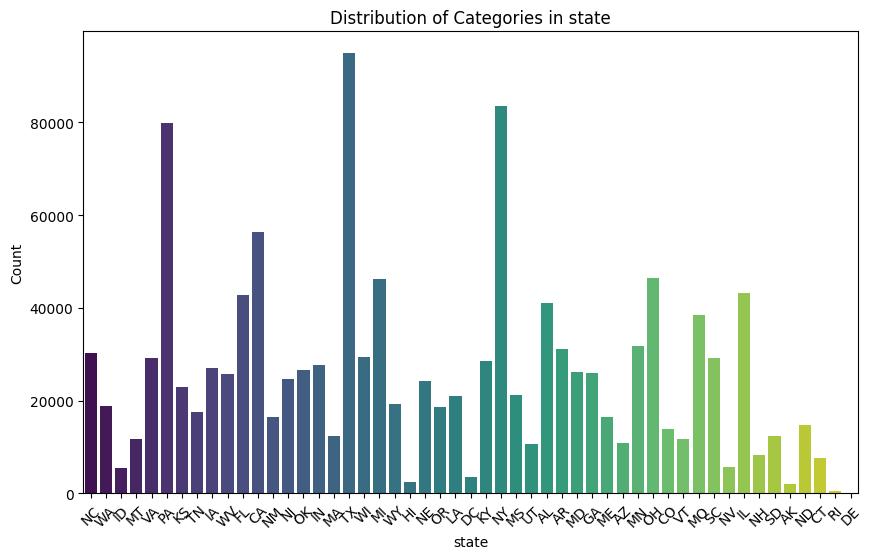

In [48]:
plot_category_distribution(df,'state')

In [27]:
def generate_boxplot(df, categorical_col, continuous_col):
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=categorical_col, y=continuous_col, data=df)
    plt.title(f'Boxplot of {continuous_col} by {categorical_col}')
    plt.xlabel(categorical_col)
    plt.ylabel(continuous_col)
    plt.xticks(rotation=0)
    plt.show()

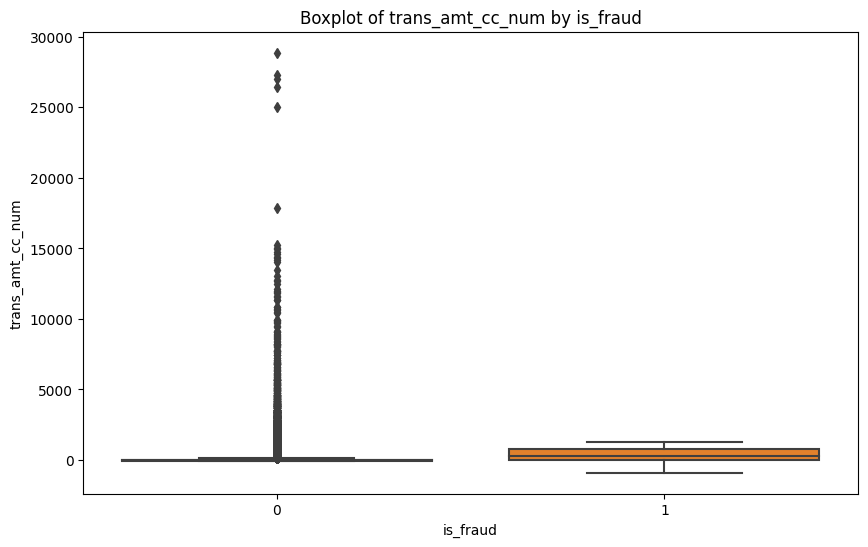

In [58]:
generate_boxplot(df,'is_fraud','trans_amt_cc_num')

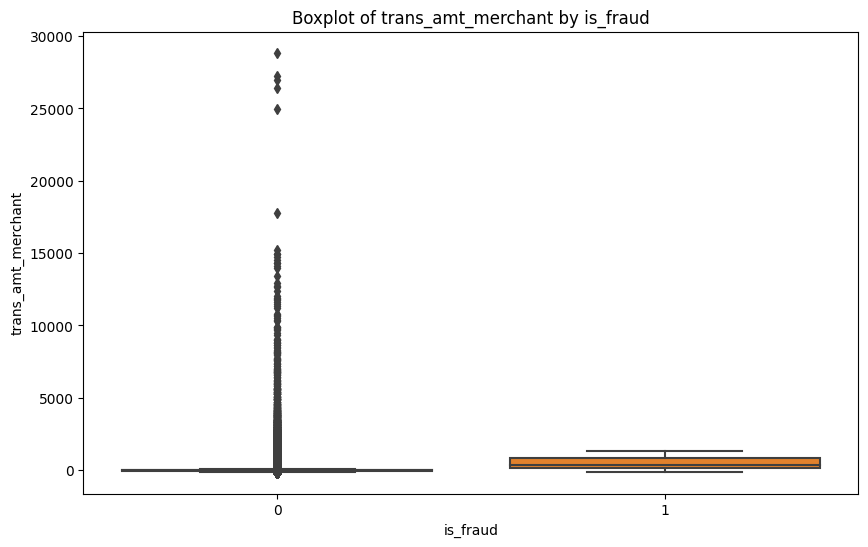

In [59]:
generate_boxplot(df,'is_fraud','trans_amt_merchant')

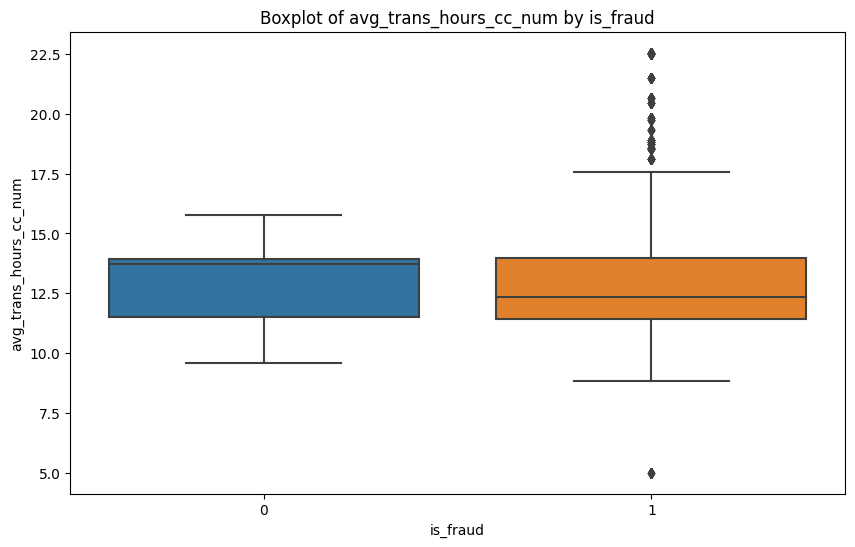

In [122]:
generate_boxplot(df,'is_fraud','avg_trans_hours_cc_num')

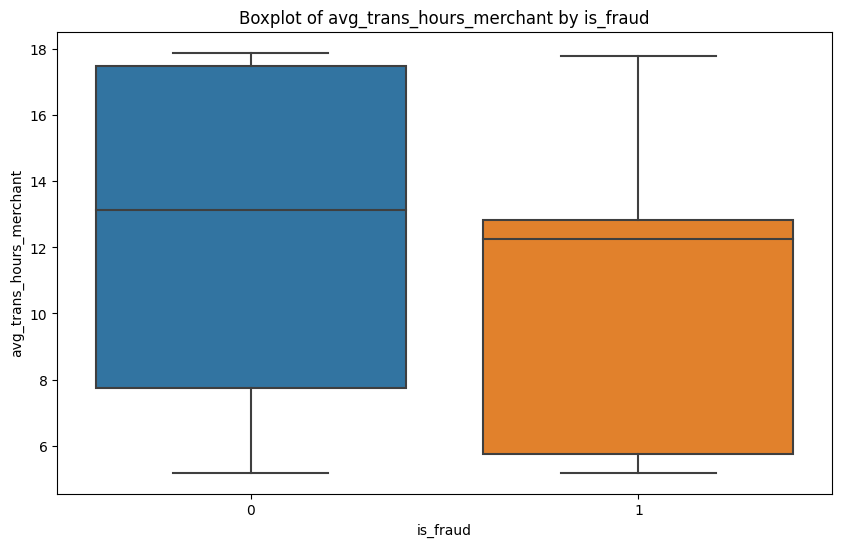

In [124]:
generate_boxplot(df,'is_fraud','avg_trans_hours_merchant')

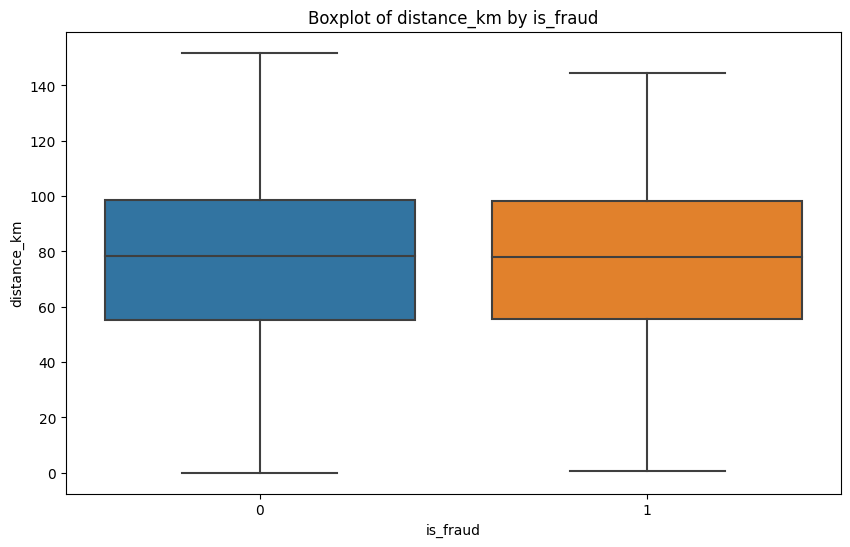

In [123]:
generate_boxplot(df,'is_fraud','distance_km')

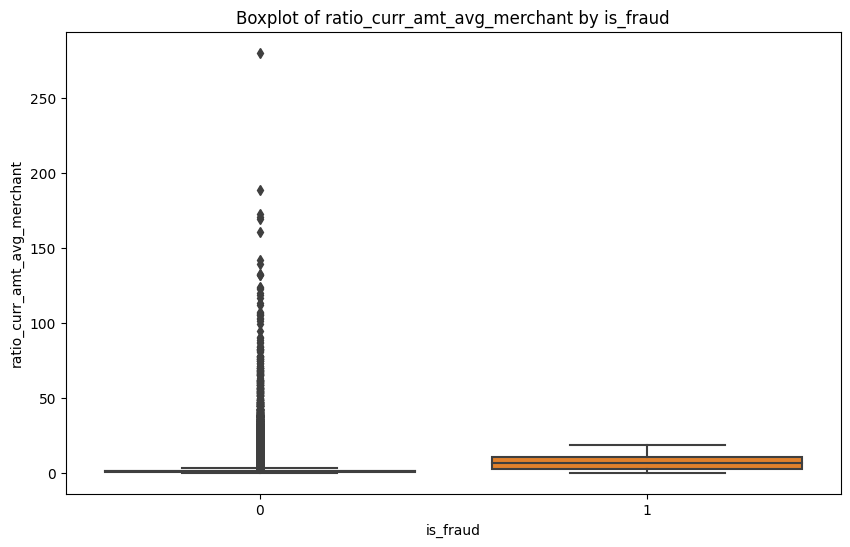

In [128]:
generate_boxplot(df,'is_fraud','ratio_curr_amt_avg_merchant')

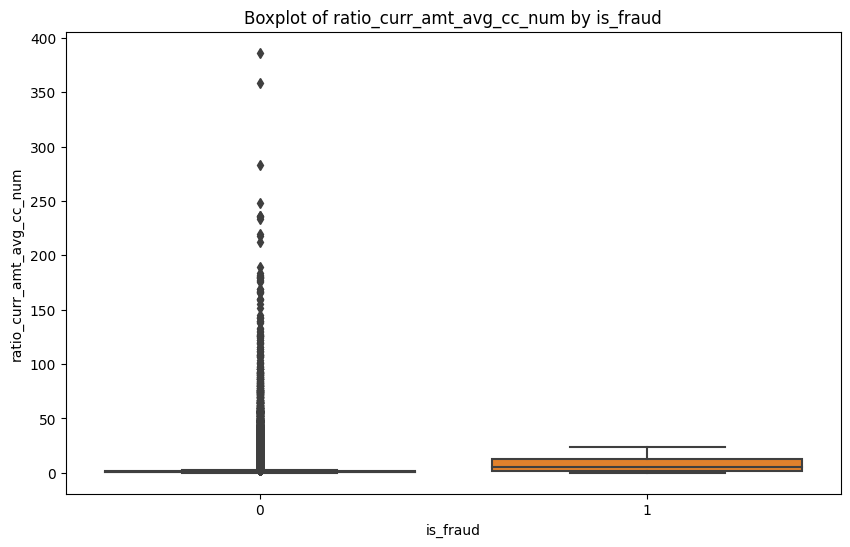

In [127]:
generate_boxplot(df,'is_fraud','ratio_curr_amt_avg_cc_num')

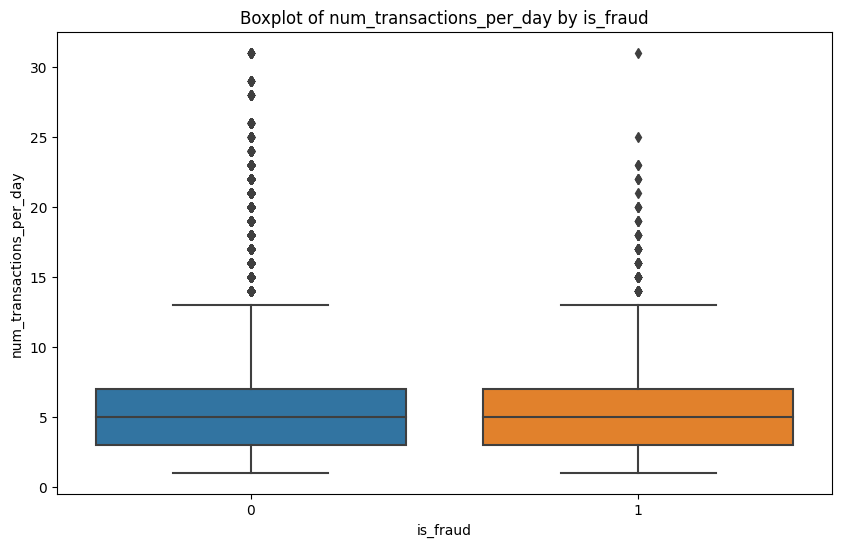

In [129]:
generate_boxplot(df,'is_fraud','num_transactions_per_day')

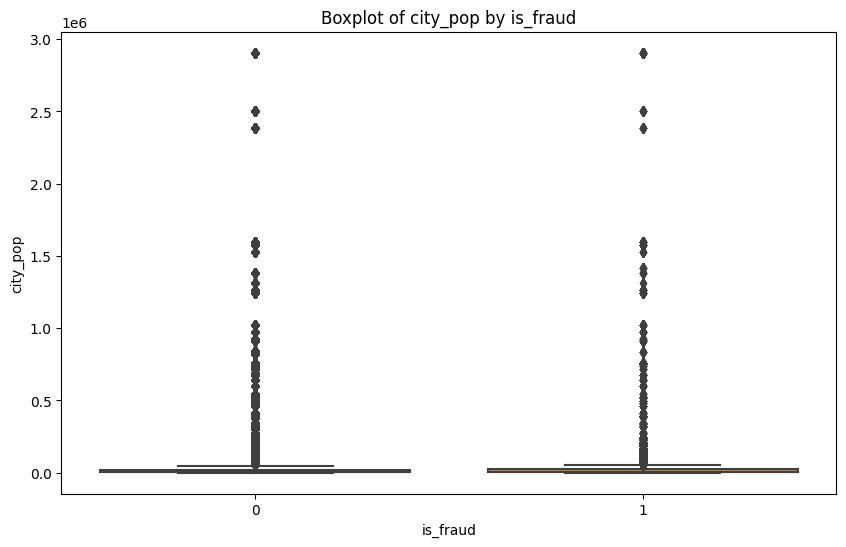

In [130]:
generate_boxplot(df,'is_fraud','city_pop')

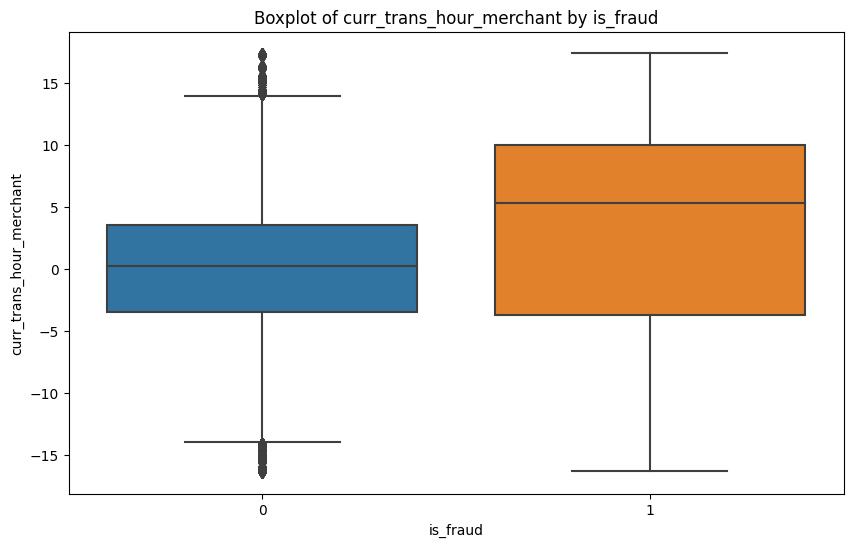

In [132]:
generate_boxplot(df,'is_fraud','curr_trans_hour_merchant')

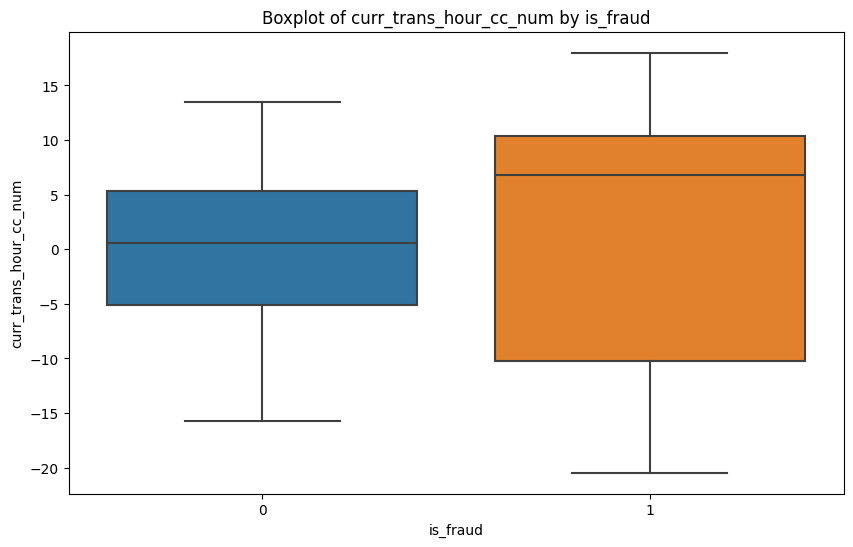

In [131]:
generate_boxplot(df,'is_fraud','curr_trans_hour_cc_num')

Handling categorical columns using encoding
1. Frequency encoding
2. Target Encoding

In [32]:
# Using Frequency Encoding to replace each category with their frequency wrt to the condition that it is fraud
def create_fraud_count_dict(data, category_column, fraud_column):
    fraud_count_dict = {}
    categories = data[category_column].unique()
    for category in categories:
        fraud_count_dict[category]=0
    for row in range(data.shape[0]):
        category = data[category_column][row]
        is_fraud = data[fraud_column][row]
        if is_fraud == 1:
            fraud_count_dict[category]+=1
    return fraud_count_dict

In [33]:
category_encoded_dict = create_fraud_count_dict(df,'category','is_fraud')
job_encoded_dict = create_fraud_count_dict(df,'job','is_fraud')
city_encoded_dict = create_fraud_count_dict(df,'city','is_fraud')
state_encoded_dict = create_fraud_count_dict(df,'state','is_fraud')
street_encoded_dict = create_fraud_count_dict(df,'street','is_fraud')

In [34]:
gender_encoded_dict = {'F':1,'M':0}
df['gender_encoded'] = df['gender'].map(gender_encoded_dict)

The above 5 dictionaries will also be used in the test data. We just need to map the dictionary to the category column

In [35]:
# Saving these dictionaries for later use in test dataset
import pickle
with open('category_encoded_dict.pkl', 'wb') as f:
    pickle.dump(category_encoded_dict, f)
with open('job_encoded_dict.pkl', 'wb') as f:
    pickle.dump(job_encoded_dict, f)
with open('city_encoded_dict.pkl', 'wb') as f:
    pickle.dump(city_encoded_dict, f)
with open('state_encoded_dict.pkl', 'wb') as f:
    pickle.dump(state_encoded_dict, f)
with open('street_encoded_dict.pkl', 'wb') as f:
    pickle.dump(street_encoded_dict, f)
with open('gender_encoded_dict.pkl', 'wb') as f:
    pickle.dump(gender_encoded_dict, f)

In [31]:
df_freq_enc =df.copy()
df_freq_enc['category_encoded'] = df_freq_enc['category'].map(category_encoded_dict)
df_freq_enc['job_encoded'] = df_freq_enc['job'].map(job_encoded_dict)
df_freq_enc['city_encoded'] = df_freq_enc['city'].map(city_encoded_dict)
df_freq_enc['state_encoded'] = df_freq_enc['state'].map(state_encoded_dict)
df_freq_enc['street_encoded'] = df_freq_enc['street'].map(street_encoded_dict)

In [32]:
def generate_kdeplots_cat_cols(df, columns, n_cols=3):
    n_plots = len(columns)
    n_rows = (n_plots + n_cols - 1) // n_cols  # Calculate the number of rows needed

    plt.figure(figsize=(n_cols * 6, n_rows * 4))

    for i, column in enumerate(columns):
        plt.subplot(n_rows, n_cols, i + 1)
        sns.kdeplot(data =df,x=df[column],palette='crest',alpha =0.3,fill=True)
        plt.title(f'KDE Plot for {column}')
        plt.xlabel(column)
        plt.ylabel('Density')

    plt.tight_layout()
    plt.show()

Handling categorical columns using Target encoding. To reduce chances of overfitting we add noise and smoothing
Target Encoding in Classification:-
Calculate the Probability of the Target Class for Each Category:

Compute the mean (or probability) of the target class for each category in the categorical feature.
Replace Each Category with Its Corresponding Probability:

Replace the categorical values with the calculated probabilities.

In [33]:
df_target_enc = df.copy()
def kfold_target_encoding(data, target, categorical_columns, n_splits=5):
    for col in categorical_columns:
        kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
        data[f'{col}_Target_Encoded'] = np.nan
        
        for train_index, val_index in kf.split(data):
            train_data = data.iloc[train_index]
            val_data = data.iloc[val_index]
            
            target_mean = train_data.groupby(col)[target].mean()
            data.loc[data.index[val_index], f'{col}_Target_Encoded'] = val_data[col].map(target_mean)
        
        # Fill any missing values with the overall mean of the target
        overall_mean = data[target].mean()
        data[f'{col}_Target_Encoded'].fillna(overall_mean, inplace=True)
        
    return data

categorical_columns = ['category','street','city','state','job']
df_target_enc = kfold_target_encoding(df_target_enc,'is_fraud',categorical_columns)

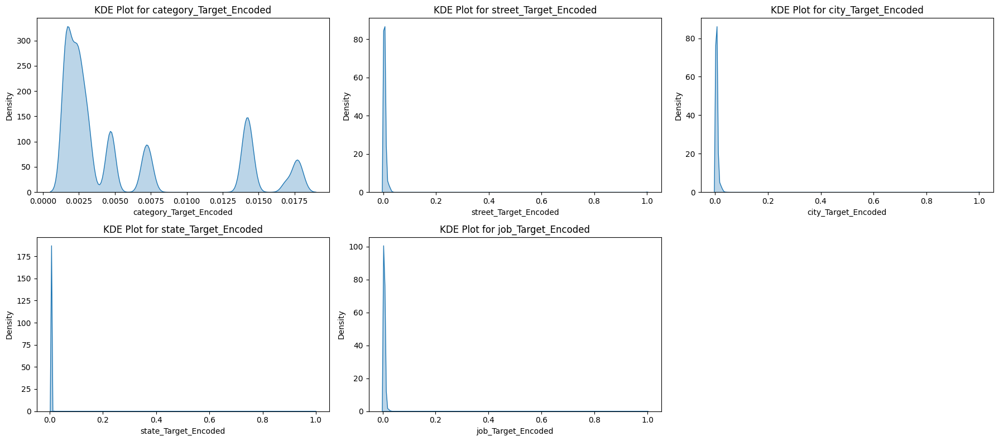

In [33]:
cols = ['category_Target_Encoded','street_Target_Encoded','city_Target_Encoded','state_Target_Encoded','job_Target_Encoded']
generate_kdeplots_cat_cols(df_target_enc,cols)

Using SMOTE to generate synthetic data to balance the dataset

In [34]:
def apply_smote(df, target_column, random_state=42):
    
    # Separate features and target
    X = df.drop(target_column, axis=1)
    y = df[target_column]
    
    # Initialize SMOTE
    smote = SMOTE(random_state=random_state)
    
    # Apply SMOTE to resample the dataset
    X_resampled, y_resampled = smote.fit_resample(X, y)
    
    # Combine resampled features and target into a new DataFrame
    df_resampled = pd.concat([pd.DataFrame(X_resampled, columns=X.columns), pd.DataFrame(y_resampled, columns=[target_column])], axis=1)
    
    df_resampled_shuffled = shuffle(df_resampled,random_state=42)
    
    return df_resampled_shuffled


In [36]:
cols_freq_enc =['lat',
'long',
'city_pop',
'unix_time',
'merch_lat',
'merch_long',
'avg_amt_spent_cc_num',
'trans_amt_cc_num',
'avg_amt_spent_merchant',
'trans_amt_merchant',
'avg_trans_hours_merchant',
'curr_trans_hour_merchant',
'avg_trans_hours_cc_num',
'curr_trans_hour_cc_num',
'num_transactions_per_day',
'ratio_curr_amt_avg_cc_num',
'ratio_curr_amt_avg_merchant',
'distance_km',
'total_amt_spent_merchant','total_amt_spent_cc_num','gender_encoded', 'category_encoded',
'job_encoded', 'city_encoded', 'state_encoded', 'street_encoded','is_fraud']

df_smote_freq_enc = df_freq_enc[cols_freq_enc]
df_resampled_freq_enc = apply_smote(df_smote_freq_enc,'is_fraud')

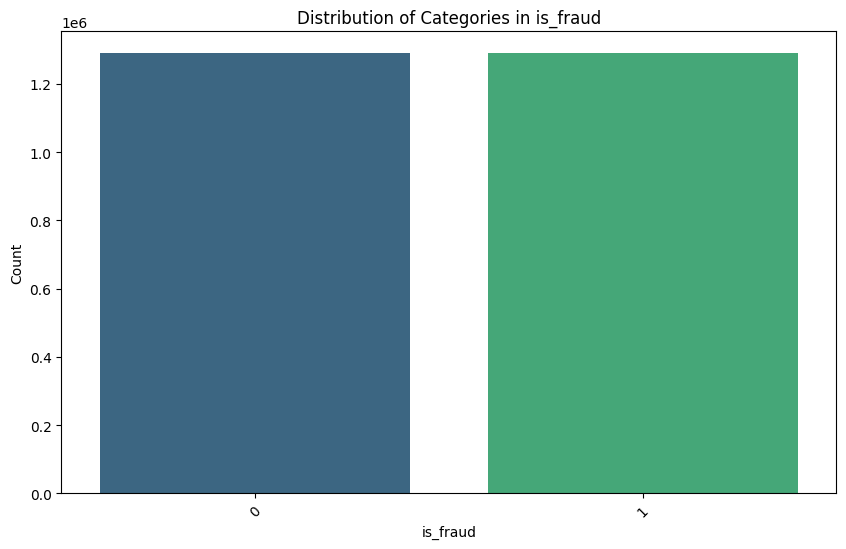

In [37]:
plot_category_distribution(df_resampled_freq_enc,'is_fraud')

In [38]:
cols_target_enc =['lat',
'long',
'city_pop',
'unix_time',
'merch_lat',
'merch_long',
'avg_amt_spent_cc_num',
'trans_amt_cc_num',
'avg_amt_spent_merchant',
'trans_amt_merchant',
'avg_trans_hours_merchant',
'curr_trans_hour_merchant',
'avg_trans_hours_cc_num',
'curr_trans_hour_cc_num',
'num_transactions_per_day',
'ratio_curr_amt_avg_cc_num',
'ratio_curr_amt_avg_merchant',
'distance_km',
'total_amt_spent_merchant','total_amt_spent_cc_num','gender_encoded', 'category_Target_Encoded',
'street_Target_Encoded', 'city_Target_Encoded', 'state_Target_Encoded',
'job_Target_Encoded','is_fraud']

df_smote_target_enc = df_target_enc[cols_target_enc]
df_resampled_target_enc = apply_smote(df_smote_target_enc,'is_fraud')

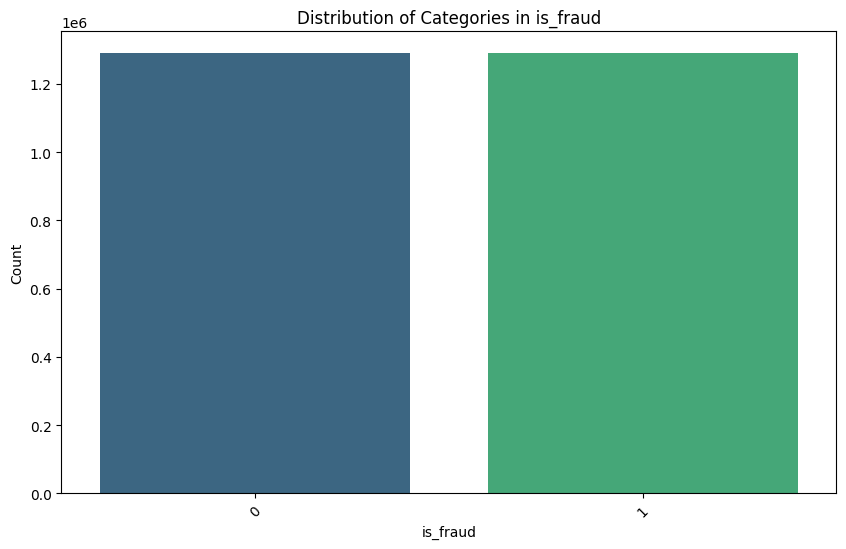

In [39]:
plot_category_distribution(df_resampled_target_enc,'is_fraud')

Handling outliers:
1. Using mean/median/mode
2. Using mean +- 3*std
3. KNN imputation
4. Using Linear Regression to replace outliers(between target column and contimuous column with outlier)
5. Simple deletion

Outliers need to be removed(deleted) from curr_trans_hour_merchant, city_pop, num_transactions_per_day, ratio_curr_amt_avg_cc_num,ratio_curr_amt_avg_merchant

In [40]:
def remove_outliers(df, columns): 
    # Create a copy of the DataFrame to avoid modifying the original one
    filtered_df = df.copy()
    
    for col in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        
        # Calculate the Interquartile Range (IQR)
        IQR = Q3 - Q1
        
        # Define the lower and upper bounds for outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Identify outliers
        outliers = ((df[col] < lower_bound) | (df[col] > upper_bound))
        
        # Filter the DataFrame
        filtered_df = filtered_df[~outliers]

    return filtered_df

In [41]:
cols_freq_enc_num =['lat',
'long',
'city_pop',
'unix_time',
'merch_lat',
'merch_long',
'avg_amt_spent_cc_num',
'trans_amt_cc_num',
'avg_amt_spent_merchant',
'trans_amt_merchant',
'avg_trans_hours_merchant',
'curr_trans_hour_merchant',
'avg_trans_hours_cc_num',
'curr_trans_hour_cc_num',
'num_transactions_per_day',
'ratio_curr_amt_avg_cc_num',
'ratio_curr_amt_avg_merchant',
'distance_km',
'total_amt_spent_merchant','total_amt_spent_cc_num']
df_freq_enc_filtered = remove_outliers(df_resampled_freq_enc,cols_freq_enc_num)

In [42]:
cols_target_enc_num =['lat',
'long',
'city_pop',
'unix_time',
'merch_lat',
'merch_long',
'avg_amt_spent_cc_num',
'trans_amt_cc_num',
'avg_amt_spent_merchant',
'trans_amt_merchant',
'avg_trans_hours_merchant',
'curr_trans_hour_merchant',
'avg_trans_hours_cc_num',
'curr_trans_hour_cc_num',
'num_transactions_per_day',
'ratio_curr_amt_avg_cc_num',
'ratio_curr_amt_avg_merchant',
'distance_km',
'total_amt_spent_merchant','total_amt_spent_cc_num']
df_target_enc_filtered = remove_outliers(df_resampled_target_enc,cols_target_enc_num)

In [43]:
print(df_freq_enc_filtered.shape)
print(df_target_enc_filtered.shape)


(1693161, 27)
(1693137, 27)


In [44]:
cont_features = [ 'lat', 'long', 'city_pop','unix_time',
       'merch_lat', 'merch_long', 'avg_amt_spent_cc_num',
       'avg_amt_spent_merchant',
       'avg_trans_hours_merchant', 'curr_trans_hour_merchant',
       'avg_trans_hours_cc_num', 'curr_trans_hour_cc_num',
       'num_transactions_per_day', 'ratio_curr_amt_avg_cc_num',
       'ratio_curr_amt_avg_merchant', 'distance_km', 'total_amt_spent_cc_num',
       'total_amt_spent_merchant']
# Using mean/median/mode

df_median_freq_enc = df_resampled_freq_enc.copy()
df_median_target_enc = df_resampled_target_enc.copy()
def median_imputation(df, features):
    for feature in features:
        df[feature] = df[feature].astype(float)
        threshold = 3
        mean = np.mean(df[feature])
        std = np.std(df[feature])
        z_scores = (df[feature] - mean) / std
        df[feature] = np.where(z_scores.abs() > threshold, df[feature].median(), df[feature])

median_imputation(df_median_freq_enc,cont_features)
median_imputation(df_median_target_enc,cont_features)

In [45]:
# Using mean+- 3*std

df_mean_std_freq_enc = df_resampled_freq_enc.copy()
df_mean_std_target_enc = df_resampled_target_enc.copy()

def mean_std_impute(df,features):
    for feature in features:
        threshold =3
        # Ensure data type is float
        df[feature] = df[feature].astype(float)
        
        # Calculate mean and standard deviation
        mean = np.mean(df[feature])
        std = np.std(df[feature])
        
        # Calculate upper and lower bounds for replacement
        upper_bound = mean + 3 * std
        lower_bound = mean - 3 * std
        z_scores = (df[feature] - mean) / std
        
        # Replace outliers with upper or lower bounds
        df[feature] = np.where(z_scores > threshold, upper_bound, df[feature])
        df[feature] = np.where(z_scores < -threshold, lower_bound, df[feature])

mean_std_impute(df_mean_std_freq_enc,cont_features)
mean_std_impute(df_mean_std_target_enc,cont_features)

From pearson correlation heatmap, trans_amt_merchant and trans_amt_cc_num are highly correlated with ratio_curr_amt_avg_merchant and ratio_curr_amt_avg_cc_num

In [46]:
highly_rel_cols_drop = ['trans_amt_cc_num','trans_amt_merchant']

mean_std_target_enc = df_mean_std_target_enc[highly_rel_cols_drop]
df_mean_std_target_enc.drop(columns=highly_rel_cols_drop,axis=1,inplace=True)

mean_std_freq_enc = df_mean_std_freq_enc[highly_rel_cols_drop]
df_mean_std_freq_enc.drop(columns=highly_rel_cols_drop,axis=1,inplace=True)

median_freq_enc = df_median_freq_enc[highly_rel_cols_drop]
df_median_freq_enc.drop(columns=highly_rel_cols_drop,axis=1,inplace=True)

median_target_enc = df_median_target_enc[highly_rel_cols_drop]
df_median_target_enc.drop(columns=highly_rel_cols_drop,axis=1,inplace=True)

target_enc_filtered = df_target_enc_filtered[highly_rel_cols_drop]
df_target_enc_filtered.drop(columns=highly_rel_cols_drop,axis=1,inplace=True)

freq_enc_filtered = df_freq_enc_filtered[highly_rel_cols_drop]
df_freq_enc_filtered.drop(columns=highly_rel_cols_drop,axis=1,inplace=True)

In [47]:
resampled_freq_enc = df_resampled_freq_enc[highly_rel_cols_drop]
df_resampled_freq_enc.drop(columns=highly_rel_cols_drop,axis=1,inplace=True)

resampled_target_enc = df_resampled_target_enc[highly_rel_cols_drop]
df_resampled_target_enc.drop(columns=highly_rel_cols_drop,axis=1,inplace=True)

In [48]:
cont_features = [ 'lat', 'long', 'city_pop','unix_time',
       'merch_lat', 'merch_long', 'avg_amt_spent_cc_num',
       'avg_amt_spent_merchant', 
       'avg_trans_hours_merchant', 'curr_trans_hour_merchant',
       'avg_trans_hours_cc_num', 'curr_trans_hour_cc_num',
       'num_transactions_per_day', 'ratio_curr_amt_avg_cc_num',
       'ratio_curr_amt_avg_merchant', 'distance_km', 'total_amt_spent_cc_num',
       'total_amt_spent_merchant']

# Using Linear regression imputation

def linear_regression_imputation(df_, features):
    df = df_.copy()
    
    for feature in features:
        # Calculate z-scores
        z_scores = (df[feature] - df[feature].mean()) / df[feature].std()
        threshold = 3
        
        # Identify outliers
        outliers = np.abs(z_scores) > threshold
        
        # Check if there are outliers
        if not outliers.any():
            continue

        # Separate the outliers and non-outliers
        non_outliers = df[~outliers]
        outliers_only = df[outliers]

        # Train a linear regression model
        X_train = non_outliers.drop(columns=[feature])
        y_train = non_outliers[feature]
        
        if X_train.shape[0] == 0 or X_train.shape[1] == 0:
            continue  # Skip if there are no non-outliers or no features left after dropping the target

        model = LinearRegression()
        model.fit(X_train, y_train)

        # Predict the outlier values
        X_outliers = outliers_only.drop(columns=[feature])
        
        if X_outliers.shape[0] == 0 or X_outliers.shape[1] == 0:
            continue  # Skip if there are no outliers or no features left after dropping the target

        outliers_only[feature] = model.predict(X_outliers)

        # Combine the data back
        df = pd.concat([non_outliers, outliers_only]).sort_index()

    return df

df_lin_freq_enc = linear_regression_imputation(df_resampled_freq_enc,cont_features)
df_lin_target_enc = linear_regression_imputation(df_resampled_target_enc,cont_features)

In [54]:
df_mean_std_target_enc.to_csv('mean_std_target_enc.csv', index=False)
df_mean_std_freq_enc.to_csv('mean_std_freq_enc.csv', index=False)

df_median_freq_enc.to_csv('median_freq_enc.csv', index=False)
df_median_target_enc.to_csv('median_target_enc.csv', index=False)

df_target_enc_filtered.to_csv('target_enc_filtered.csv', index=False)
df_freq_enc_filtered.to_csv('freq_enc_filtered.csv', index=False)

df_resampled_freq_enc.to_csv('resampled_freq_enc.csv', index=False)
df_resampled_target_enc.to_csv('resampled_target_enc.csv', index=False)

df_lin_freq_enc.to_csv('lin_freq_enc.csv', index=False)
df_lin_target_enc.to_csv('lin_target_enc.csv', index=False)

In [22]:
df_mean_std_target_enc = pd.read_csv('D:\\Fault Transactions\\notebook\\mean_std_target_enc.csv',na_values='na')
df_mean_std_freq_enc = pd.read_csv('D:\\Fault Transactions\\notebook\\mean_std_freq_enc.csv',na_values='na')

df_median_freq_enc = pd.read_csv('D:\\Fault Transactions\\notebook\\median_freq_enc.csv',na_values='na')
df_median_target_enc = pd.read_csv('D:\\Fault Transactions\\notebook\\median_target_enc.csv',na_values='na')

df_target_enc_filtered = pd.read_csv('D:\\Fault Transactions\\notebook\\target_enc_filtered.csv',na_values='na')
df_freq_enc_filtered = pd.read_csv('D:\\Fault Transactions\\notebook\\freq_enc_filtered.csv',na_values='na')

df_resampled_target_enc = pd.read_csv('D:\\Fault Transactions\\notebook\\resampled_target_enc.csv',na_values='na')
df_resampled_freq_enc = pd.read_csv('D:\\Fault Transactions\\notebook\\resampled_freq_enc.csv',na_values='na')

df_lin_freq_enc = pd.read_csv('D:\\Fault Transactions\\notebook\\lin_freq_enc.csv',na_values='na')
df_lin_target_enc = pd.read_csv('D:\\Fault Transactions\\notebook\\lin_target_enc.csv',na_values='na')


In [ ]:
# KNN Imputation
def knn_imputation(df_,features):
    df = df_.copy()
    for feature in features:
        threshold =3
        # Ensure data type is float
        df[feature] = df[feature].astype(float)
        
        z_scores = np.abs((df[feature]-df[feature].mean())/df[feature].std())
        # Replace outliers with NaN values
        df[feature] = df[feature].mask(z_scores > threshold)

    # Perform KNN imputation
    imputer = KNNImputer(n_neighbors= 7)
    df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

    return df_imputed

df_knn_freq_enc = knn_imputation(df_resampled_freq_enc,cont_features)
df_knn_target_enc = knn_imputation(df_resampled_target_enc,cont_features)

In [138]:
sel_cols_for_fea_selec = ['city_pop', 'unix_time', 'is_fraud', 'avg_amt_spent_cc_num', 
       'avg_amt_spent_merchant', 
       'avg_trans_hours_merchant', 'curr_trans_hour_merchant',
       'avg_trans_hours_cc_num', 'curr_trans_hour_cc_num',
       'num_transactions_per_day', 'ratio_curr_amt_avg_cc_num',
       'ratio_curr_amt_avg_merchant', 'distance_km', 'total_amt_spent_cc_num',
       'total_amt_spent_merchant', 'category_encoded', 'job_encoded',
       'city_encoded', 'state_encoded', 'street_encoded', 'gender_encoded']

Using some feature selection techniques

In [14]:
def feature_selection(df, target_col, numerical_cols, categorical_cols,k=0):
    X_numerical = df[numerical_cols] 
    X_categorical = df[categorical_cols] 
    y = df[target_col]
    
    selected_features_numerical = []
    selected_features_categorical = []
    
    # Apply ANOVA F-test to select numerical columns
    k = 10
    selector = SelectKBest(f_classif, k=min(k, X_numerical.shape[1]))
    X_new_numerical = selector.fit_transform(X_numerical, y)
    selected_features_numerical = X_numerical.columns[selector.get_support(indices=True)]
    
    # Apply Chi-square test to select categorical columns
    k = 3
    selector = SelectKBest(chi2, k=min(k, X_categorical.shape[1]))
    X_new_categorical = selector.fit_transform(X_categorical, y)
    selected_features_categorical = X_categorical.columns[selector.get_support(indices=True)]
    
    # Combine selected features 
    X_new_df_numerical = pd.DataFrame(X_new_numerical, columns=selected_features_numerical) 
    X_new_df_categorical = pd.DataFrame(X_new_categorical, columns=selected_features_categorical) 
    
    X_new_df = pd.concat([X_new_df_numerical, X_new_df_categorical], axis=1)
    
    # Add the target column back to the DataFrame
    df_new = pd.concat([X_new_df, y.reset_index(drop=True)], axis=1) # final dataframe for model training
    
    return df_new


In [1]:
def pca_reduction(df,target_col,cont_features,n_components=15):
    # Standardize the data
    features = df.drop(target_col,axis=1)
    target = df[target_col]
    scaler = StandardScaler()
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', scaler, [col for col in features.columns if col in cont_features])
        ])
    processed_features = preprocessor.fit_transform(features)

    # Initialize PCA
    pca = PCA(n_components=n_components)
    pca.fit(processed_features)
    principal_components = pca.transform(processed_features)

    # Create a DataFrame with the principal components
    principal_components_df = pd.DataFrame(data=principal_components, columns=[f'PC{i+1}' for i in range(n_components)])

    return principal_components_df,target

In [5]:
numerical_cols = [ 'lat', 'long', 'city_pop','unix_time',
       'merch_lat', 'merch_long', 'avg_amt_spent_cc_num',
       'avg_amt_spent_merchant',
       'avg_trans_hours_merchant', 'curr_trans_hour_merchant',
       'avg_trans_hours_cc_num', 'curr_trans_hour_cc_num',
       'num_transactions_per_day', 'ratio_curr_amt_avg_cc_num',
       'ratio_curr_amt_avg_merchant', 'distance_km', 'total_amt_spent_cc_num',
       'total_amt_spent_merchant']
categorical_cols_target = ['category_Target_Encoded','street_Target_Encoded','state_Target_Encoded','job_Target_Encoded','gender_encoded','city_Target_Encoded']
categorical_cols_freq = ['category_encoded','street_encoded','state_encoded','job_encoded','gender_encoded','city_encoded']
target_col ='is_fraud'

In [7]:
def evaluate_model(y_true, y_pred):
    # Calculate evaluation metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    
    print(f'accuracy: {accuracy:.2f}')
    print(f'precision: {precision:.2f}')
    print(f'recall: {recall:.2f}')
    print(f'f1: {f1:.2f}')
    print("Confusion Matrix:")
    print(cm)
    
    return accuracy, precision, recall, f1, cm

In [66]:
X_mean_std_target_enc, target = pca_reduction(df_mean_std_target_enc, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_mean_std_target_enc.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
classifier = RandomForestClassifier(random_state=42)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
report = evaluate_model(y_test,y_pred)

accuracy: 0.96
precision: 0.98
recall: 0.95
f1: 0.96
Confusion Matrix:
[[9803  201]
 [ 503 9493]]


In [65]:
X_mean_std_freq_enc, target = pca_reduction(df_mean_std_freq_enc, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_mean_std_freq_enc.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
classifier = RandomForestClassifier(random_state=42)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
report = evaluate_model(y_test,y_pred)

accuracy: 0.96
precision: 0.98
recall: 0.95
f1: 0.96
Confusion Matrix:
[[9809  195]
 [ 517 9479]]


In [63]:
X_lin_target_enc, target = pca_reduction(df_lin_target_enc, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_lin_target_enc.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
classifier_target_enc = RandomForestClassifier(random_state=42)
classifier_target_enc.fit(X_train, y_train)
y_pred = classifier_target_enc.predict(X_test)
report =evaluate_model(y_test,y_pred)

accuracy: 1.00
precision: 0.95
recall: 0.59
f1: 0.73
Confusion Matrix:
[[19789     7]
 [   83   121]]


In [62]:
X_lin_freq_enc, target = pca_reduction(df_lin_freq_enc, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_lin_freq_enc.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
classifier_freq_enc= RandomForestClassifier(random_state=42)
classifier_freq_enc.fit(X_train, y_train)
y_pred = classifier_freq_enc.predict(X_test)
report = evaluate_model(y_test,y_pred)

accuracy: 0.99
precision: 0.93
recall: 0.55
f1: 0.69
Confusion Matrix:
[[19788     8]
 [   92   112]]


In [67]:
X_freq_enc_filtered, target = pca_reduction(df_freq_enc_filtered, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_freq_enc_filtered.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
classifier= RandomForestClassifier(random_state=42)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
report = evaluate_model(y_test,y_pred)

accuracy: 0.97
precision: 0.98
recall: 0.95
f1: 0.96
Confusion Matrix:
[[10974   181]
 [  460  8385]]


In [68]:
X_target_enc_filtered, target = pca_reduction(df_target_enc_filtered, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_target_enc_filtered.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
classifier= RandomForestClassifier(random_state=42)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
report = evaluate_model(y_test,y_pred)

accuracy: 0.97
precision: 0.98
recall: 0.94
f1: 0.96
Confusion Matrix:
[[10976   188]
 [  490  8346]]


In [69]:
X_median_freq_enc, target = pca_reduction(df_median_freq_enc, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_median_freq_enc.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
classifier= RandomForestClassifier(random_state=42)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
report = evaluate_model(y_test,y_pred)


accuracy: 0.96
precision: 0.97
recall: 0.95
f1: 0.96
Confusion Matrix:
[[9757  247]
 [ 540 9456]]


In [70]:
X_median_target_enc, target = pca_reduction(df_median_target_enc, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_median_target_enc.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
classifier= RandomForestClassifier(random_state=42)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
report = evaluate_model(y_test,y_pred)

accuracy: 0.96
precision: 0.98
recall: 0.95
f1: 0.96
Confusion Matrix:
[[9769  235]
 [ 540 9456]]


Choosing between df_lin_freq_enc, df_freq_enc_filtered, df_lin_target_enc to see which peforms well in big data, since all of the 3 dataframes performed well with simple Random Forest

In [71]:
X_lin_freq_enc, target = pca_reduction(df_lin_freq_enc, 'is_fraud', numerical_cols)
classifier= RandomForestClassifier(random_state=42)
classifier.fit(X_lin_freq_enc.iloc[0:100000,:], target[0:100000])
y_pred = classifier.predict(X_lin_freq_enc.iloc[100000:,:])
report = evaluate_model(target[100000:],y_pred)

accuracy: 0.70
precision: 0.99
recall: 0.43
f1: 0.60
Confusion Matrix:
[[1185975    4184]
 [ 735094  553085]]


In [72]:
X_freq_enc_filtered, target = pca_reduction(df_freq_enc_filtered, 'is_fraud', numerical_cols)
classifier= RandomForestClassifier(random_state=42)
classifier.fit(X_freq_enc_filtered.iloc[0:100000,:], target[0:100000])
y_pred = classifier.predict(X_freq_enc_filtered.iloc[100000:,:])
report = evaluate_model(target[100000:],y_pred)

accuracy: 0.97
precision: 0.98
recall: 0.96
f1: 0.97
Confusion Matrix:
[[869805  14475]
 [ 31887 676994]]


In [85]:
X_lin_target_enc, target = pca_reduction(df_lin_target_enc, 'is_fraud', numerical_cols)
classifier= RandomForestClassifier(random_state=42)
classifier.fit(X_lin_target_enc.iloc[0:100000,:], target[0:100000])
y_pred = classifier.predict(X_lin_target_enc.iloc[100000:,:])
report = evaluate_model(target[100000:],y_pred)

accuracy: 0.71
precision: 0.99
recall: 0.45
f1: 0.62
Confusion Matrix:
[[1186639    3520]
 [ 708608  579571]]


In [23]:
X_lin_target_enc, target = pca_reduction(df_lin_target_enc, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_lin_target_enc.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
clf = RandomForestClassifier()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_lin_target_enc.iloc[100000:1693162,:])
report=evaluate_model(target[100000:1693162],y_pred)

accuracy: 0.85
precision: 0.94
recall: 0.44
f1: 0.60
Confusion Matrix:
[[1178489   11670]
 [ 227141  175862]]


In [37]:
print('% incorrect prediction for frequency encoded filtered = ',(14475+31887)*100/(869805+14475+31887+676994))
print('% incorrect prediction for linear regression imputed target encoded = ',(11670+227141)*100/(1178489+11670+227141+175862))

% incorrect prediction for frequency encoded filtered =  2.9100637035428307
% incorrect prediction for linear regression imputed target encoded =  14.98974994382241


Therefore using PCA and Random Forest Classifier the best dataframe is frequency encoded and filtered with 97% accuracy without hyperparameter tuning : df_freq_enc_filtered

In [26]:
X_freq_enc_filtered, target = pca_reduction(df_freq_enc_filtered, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_freq_enc_filtered.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
clf = AdaBoostClassifier()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_freq_enc_filtered.iloc[100000:,:])
report=evaluate_model(target[100000:],y_pred)

accuracy: 0.88
precision: 0.91
recall: 0.81
f1: 0.86
Confusion Matrix:
[[829214  55066]
 [133168 575713]]


In [28]:
X_freq_enc_filtered, target = pca_reduction(df_freq_enc_filtered, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_freq_enc_filtered.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
clf = HistGradientBoostingClassifier()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_freq_enc_filtered.iloc[100000:,:])
report=evaluate_model(target[100000:],y_pred)

accuracy: 0.94
precision: 0.96
recall: 0.91
f1: 0.93
Confusion Matrix:
[[855768  28512]
 [ 63299 645582]]


In [29]:
X_freq_enc_filtered, target = pca_reduction(df_freq_enc_filtered, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_freq_enc_filtered.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
clf = GradientBoostingClassifier()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_freq_enc_filtered.iloc[100000:,:])
report=evaluate_model(target[100000:],y_pred)

accuracy: 0.90
precision: 0.95
recall: 0.83
f1: 0.89
Confusion Matrix:
[[851926  32354]
 [119312 589569]]


In [33]:
X_freq_enc_filtered, target = pca_reduction(df_freq_enc_filtered, 'is_fraud', numerical_cols)
X_train, X_test, y_train, y_test = train_test_split(X_freq_enc_filtered.iloc[0:100000,:], target[0:100000], test_size=0.2, random_state=42)
clf = lgb.LGBMClassifier()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_freq_enc_filtered.iloc[100000:,:])
report=evaluate_model(target[100000:],y_pred)

[LightGBM] [Info] Number of positive: 35695, number of negative: 44305
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 80000, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.446188 -> initscore=-0.216087
[LightGBM] [Info] Start training from score -0.216087
accuracy: 0.94
precision: 0.96
recall: 0.91
f1: 0.93
Confusion Matrix:
[[856305  27975]
 [ 62707 646174]]


In [44]:
def evaluate_models_report(X, y, classifiers, test_size=0.2, random_state=42):
    # Split the dataset
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # DataFrame to store results
    results = pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1', 'TP', 'TN', 'FP', 'FN'])

    # Evaluate each classifier
    for name, clf in classifiers.items():
        print(f"--- {name} ---")
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        
        # Compute metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        
        # Append results to the DataFrame
        new_row = pd.DataFrame([{
            'Model': name,
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1': f1,
            'TP': tp,
            'TN': tn,
            'FP': fp,
            'FN': fn
        }])
        
        # Append the new row to the results DataFrame
        results = pd.concat([results, new_row], ignore_index=True)
    
    return results
classifiers ={
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'KNN': KNeighborsClassifier(),
    'Catboost': CatBoostClassifier(verbose=0),
    'XGB': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
}
X = X_freq_enc_filtered.iloc[0:120000,:]
y = target[0:120000]
evaluate_models_report(X,y,classifiers)

--- Decision Tree ---
--- Random Forest ---
--- KNN ---
--- Catboost ---
--- XGB ---


,Model,Accuracy,Precision,Recall,F1,TP,TN,FP,FN
0,Decision Tree,0.936833,0.922666,0.936652,0.929606,10010,12474,839,677
1,Random Forest,0.970833,0.979085,0.954898,0.966840,10205,13095,218,482
2,KNN,0.956792,0.921103,0.987555,0.953172,10554,12409,904,133
3,Catboost,0.970417,0.975503,0.957612,0.966475,10234,13056,257,453
4,XGB,0.963292,0.968828,0.948068,0.958335,10132,12987,326,555


From the above report KNN perform well in determining FN's while Random Forest did well in finding FP's. So we can perform hyperparameter tuning on both of them and combine them to make a better model

In [46]:
def grid_search_cv(X, y, test_size=0.2, random_state=42):
    # Split the dataset
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    # Define the classifiers
    param_grid={
        'KNN': {
        'n_neighbors': [3, 5, 7, 9],
        'weights': ['uniform', 'distance'],
        'algorithm': ['auto', 'ball_tree',]
        },
        'Random Forest': {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 2],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
        }
    }
    classifiers = {
        'KNN': KNeighborsClassifier(),
        'Random Forest': RandomForestClassifier()
    }

    # Perform Grid Search CV for each classifier
    for name, clf in classifiers.items():
        print(f"--- {name} ---")
        grid_search = GridSearchCV(clf, param_grid[name], cv=5, scoring='f1', n_jobs=-1)
        grid_search.fit(X_train, y_train)
        best_clf = grid_search.best_estimator_
        y_pred = best_clf.predict(X_test)
        
        print(f"Best Parameters: {grid_search.best_params_}")
        print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
        print(f"Precision: {precision_score(y_test, y_pred):.4f}")
        print(f"Recall: {recall_score(y_test, y_pred):.4f}")
        print(f"F1 Score: {f1_score(y_test, y_pred):.4f}")
        print(f"Confusion Matrix:\n{confusion_matrix(y_test, y_pred)}\n")
        
grid_search_cv(X_freq_enc_filtered.iloc[0:120000,:],target[0:120000])    

--- KNN ---
Best Parameters: {'algorithm': 'auto', 'n_neighbors': 3, 'weights': 'distance'}
Accuracy: 0.9643
Precision: 0.9302
Recall: 0.9946
F1 Score: 0.9613
Confusion Matrix:
[[12515   798]
 [   58 10629]]

--- Random Forest ---
Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy: 0.9701
Precision: 0.9801
Recall: 0.9522
F1 Score: 0.9659
Confusion Matrix:
[[13106   207]
 [  511 10176]]



In [58]:
X_train, y_train = X_freq_enc_filtered.iloc[0:100000,:], target[0:100000]
X_test = X_freq_enc_filtered.iloc[100000:,:]
y_test = target[100000:]

In [54]:
rf_best_params = {'n_estimators': 100, 'max_depth': None, 'min_samples_leaf':1,'min_samples_split':2}
knn_best_params = {'n_neighbors': 3, 'weights': 'distance','algorithm':'auto'}

# Create the classifiers with the best parameters
rf = RandomForestClassifier(**rf_best_params)
knn = KNeighborsClassifier(**knn_best_params)

voting_clf = VotingClassifier(estimators=[('rf', rf), ('knn', knn)], voting='hard')
voting_clf.fit(X_train,y_train)
y_pred = voting_clf.predict(X_test)
evaluate_model(y_test,y_pred)

accuracy: 0.97
precision: 0.99
recall: 0.95
f1: 0.97
Confusion Matrix:
[[875921   8359]
 [ 34153 674728]]


(0.973315942331001,
 0.9877629057499264,
 0.9518212506753602,
 0.9694590680245523,
 array([[875921,   8359],
        [ 34153, 674728]], dtype=int64))

In [60]:
stacking_clf = StackingClassifier(
    estimators=[('rf', rf), ('knn', knn)],
    final_estimator=LogisticRegression()
)
stacking_clf.fit(X_train,y_train)
y_pred = stacking_clf.predict(X_test)
evaluate_model(y_test,y_pred)

accuracy: 0.98
precision: 0.98
recall: 0.98
f1: 0.98
Confusion Matrix:
[[868001  16279]
 [ 11590 697291]]


(0.9825071038018128,
 0.9771865409139958,
 0.9836502882712331,
 0.9804077609703252,
 array([[868001,  16279],
        [ 11590, 697291]], dtype=int64))

In [63]:
joblib_file = "stack_clf.joblib"
joblib.dump(stacking_clf, joblib_file)

['stack_clf.joblib']

In [62]:
base_classifiers = [rf,knn]
def random_base_classifier():
    return np.random.choice(base_classifiers)

# Create the bagging classifier
bagging_clf = BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=10)
bagging_clf.fit(X_train,y_train)
y_pred = bagging_clf.predict(X_test)
evaluate_model(y_test,y_pred)

accuracy: 0.96
precision: 0.97
recall: 0.94
f1: 0.96
Confusion Matrix:
[[864669  19611]
 [ 41412 667469]]


(0.9616969032006182,
 0.9714574722011993,
 0.9415811680662904,
 0.9562860280480616,
 array([[864669,  19611],
        [ 41412, 667469]], dtype=int64))

## The Best Model is Meta model with KNN and Random Forest Stacked nad base estimator as Logistic.
## The final accuracy is 98%